In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.reset_option('max_columns')

#pd.reset_option('max_rows')
#pd. set_option('display.max_rows', None)

# https://towardsdatascience.com/building-an-employee-churn-model-in-python-to-develop-a-strategic-retention-plan-57d5bd882c2d

In [2]:
df=pd.read_excel('Customer Churn Data.xlsx',sheet_name='Data for DSBA')
df.head(150)

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,20145,0,28,1.0,6.0,Credit Card,Male,2.0,3,Regular,5.0,Single,1,1.0,14,4,13,290.45,Mobile
146,20146,1,10,1.0,35.0,Debit Card,Male,2.0,3,HNI,4.0,Divorced,2,1.0,12,5,9,218.49,Computer
147,20147,0,1,1.0,15.0,Credit Card,Male,3.0,3,Regular Plus,2.0,Divorced,2,0.0,23,1,4,120.7,Mobile
148,20148,0,10,3.0,12.0,Credit Card,Male,3.0,3,Super,2.0,Divorced,5,0.0,14,0,1,165.02,Mobile


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [4]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
AccountID,11260.0,NaN,NaN,NaN,25629.5,3250.62635,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,NaN,NaN,NaN,0.168384,0.374223,0.0,0.0,0.0,0.0,1.0
Tenure,11158.0,38.0,1.0,1351.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_Tier,11148.0,NaN,NaN,NaN,1.653929,0.915015,1.0,1.0,1.0,3.0,3.0
CC_Contacted_LY,11158.0,NaN,NaN,NaN,17.867091,8.853269,4.0,11.0,16.0,23.0,132.0
Payment,11151,5,Debit Card,4587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,11152,4,Male,6328,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,11162.0,NaN,NaN,NaN,2.902526,0.725584,0.0,2.0,3.0,3.0,5.0
Account_user_count,11148.0,7.0,4.0,4569.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_segment,11163,7,Super,4062,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Cleaning - Removing the Special Characters and replace with Null

In [5]:
obj_col=list(df.select_dtypes(['object']).columns)


In [6]:
special =  '[(_:/*$+#%&\=@)]'

In [7]:
for s in obj_col:
    print(s,' --- ',df[s].str.contains(special).sum())

Tenure  ---  116
Payment  ---  0
Gender  ---  0
Account_user_count  ---  332
account_segment  ---  309
Marital_Status  ---  0
rev_per_month  ---  689
rev_growth_yoy  ---  3
coupon_used_for_payment  ---  3
Day_Since_CC_connect  ---  1
cashback  ---  2
Login_device  ---  539


In [8]:
df[df["Tenure"]=='#']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
12,20012,1,#,1.0,11.0,Cash on Delivery,Male,2.0,3,Regular Plus,3.0,Single,2,1.0,13,2,2,134.41,Mobile
15,20015,1,#,2.0,12.0,UPI,Male,3.0,3,Regular Plus,5.0,Married,5,1.0,22,1,2,120.73,Mobile
575,20575,1,#,1.0,8.0,Cash on Delivery,Male,2.0,3,Regular Plus,3.0,Single,5,0.0,24,1,0,124.79,Mobile
754,20754,0,#,3.0,13.0,E wallet,Male,2.0,1,Super,2.0,Married,1,1.0,18,0,9,152.2,Mobile
979,20979,0,#,1.0,15.0,Debit Card,Male,3.0,1,Regular Plus,3.0,Married,7,0.0,18,1,0,124.51,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10998,30998,0,#,1.0,15.0,Credit Card,Male,3.0,5,Super,1.0,Married,5,0.0,17,1,14,169.86,Mobile
11057,31057,0,#,3.0,24.0,Debit Card,Male,3.0,4,Super,3.0,Married,7,1.0,16,2,8,170.01,Computer
11150,31150,0,#,1.0,18.0,Credit Card,Female,4.0,2,Regular Plus,3.0,Married,12,0.0,14,2,3,168.78,Mobile
11157,31157,0,#,1.0,12.0,Cash on Delivery,Male,3.0,4,Regular Plus,4.0,Married,3,0.0,13,1,3,152.26,Mobile


In [9]:
df.tail(65)

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
11195,31195,0,5,1.0,20.0,Credit Card,Female,3.0,4,HNI,3.0,Married,9,0.0,21,4,9,242.31,Computer
11196,31196,0,28,1.0,24.0,Credit Card,Female,4.0,4,Super,5.0,Single,9,1.0,22,1,5,170.4,Mobile
11197,31197,0,1,1.0,10.0,Debit Card,Male,3.0,@,Super,3.0,Single,+,0.0,15,2,3,175.17,&&&&
11198,31198,0,1,1.0,25.0,UPI,Male,4.0,4,Regular Plus,1.0,Single,5,0.0,15,2,5,152.47,Mobile
11199,31199,0,14,1.0,21.0,Cash on Delivery,Female,4.0,4,Super,3.0,Married,6,0.0,14,8,5,189.23,Computer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,31255,0,10,1.0,34.0,Credit Card,Male,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,Male,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,Male,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,Male,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer


In [10]:
import re
def strip_character(dataCol):
    r = re.compile('[^a-zA-Z0-9 \n\.]')
    return r.sub('', dataCol)



In [11]:
for s in obj_col:
    df[s] = df[s].astype(str)


In [12]:
for i in obj_col:
    print(i)
    print(df[i].value_counts())

Tenure
1      1351
0      1231
8       519
9       496
7       450
10      423
3       410
5       403
4       403
11      388
6       363
12      360
13      359
2       354
14      345
15      311
16      291
19      273
18      253
20      217
17      215
21      170
23      169
22      151
24      147
28      137
30      137
99      131
27      131
26      122
#       116
25      114
29      114
nan     102
31       96
50        2
60        2
51        2
61        2
Name: Tenure, dtype: int64
Payment
Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
nan                  109
Name: Payment, dtype: int64
Gender
Male      6328
Female    4178
M          376
F          270
nan        108
Name: Gender, dtype: int64
Account_user_count
4      4569
3      3261
5      1699
2       526
1       446
@       332
6       315
nan     112
Name: Account_user_count, dtype: int64
account_segment
Super           4062
Regular Plus

In [13]:
obj_col=list(df.select_dtypes(['object']).columns)
for i in obj_col:
    if i !='account_segment':
        df[i]=df[i].apply(strip_character)


In [14]:
for i in obj_col:
    print(i)
    print(df[i].value_counts())

Tenure
1      1351
0      1231
8       519
9       496
7       450
10      423
3       410
5       403
4       403
11      388
6       363
12      360
13      359
2       354
14      345
15      311
16      291
19      273
18      253
20      217
17      215
21      170
23      169
22      151
24      147
28      137
30      137
99      131
27      131
26      122
        116
25      114
29      114
nan     102
31       96
50        2
60        2
51        2
61        2
Name: Tenure, dtype: int64
Payment
Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
nan                  109
Name: Payment, dtype: int64
Gender
Male      6328
Female    4178
M          376
F          270
nan        108
Name: Gender, dtype: int64
Account_user_count
4      4569
3      3261
5      1699
2       526
1       446
        332
6       315
nan     112
Name: Account_user_count, dtype: int64
account_segment
Super           4062
Regular Plus

In [15]:
df[df['Tenure']=='nan']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
84,20084,0,nan,1.0,6.0,Credit Card,Male,3.0,3,HNI,5.0,Married,8,0.0,16,0,3,193.96,Mobile
92,20092,1,nan,1.0,6.0,Cash on Delivery,Male,2.0,3,Regular Plus,3.0,Single,1,0.0,14,0,5,120.58000000000001,Mobile
259,20259,0,nan,3.0,8.0,Credit Card,Male,3.0,4,HNI,3.0,Divorced,2,0.0,13,9,0,175.96,Mobile
565,20565,0,nan,1.0,18.0,Credit Card,Female,2.0,3,Super,2.0,Divorced,1,1.0,11,0,5,158.55,Mobile
568,20568,1,nan,3.0,9.0,Debit Card,Male,2.0,4,HNI,2.0,Divorced,2,1.0,11,3,7,203.25,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10552,30552,1,nan,1.0,15.0,Debit Card,Male,3.0,4,Regular Plus,5.0,Married,11,1.0,15,1,3,150.42,Computer
10723,30723,0,nan,1.0,13.0,Cash on Delivery,Male,3.0,4,Regular Plus,5.0,Single,8,0.0,14,2,3,145.8,Mobile
10846,30846,1,nan,3.0,10.0,Cash on Delivery,Male,4.0,4,Regular Plus,3.0,Married,5,0.0,18,2,3,156.09,Computer
10959,30959,0,nan,1.0,21.0,Credit Card,Female,3.0,2,Regular Plus,3.0,Married,11,0.0,19,1,3,160.17,Mobile


In [16]:
df[df['Tenure']=='']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
12,20012,1,,1.0,11.0,Cash on Delivery,Male,2.0,3,Regular Plus,3.0,Single,2,1.0,13,2,2,134.41,Mobile
15,20015,1,,2.0,12.0,UPI,Male,3.0,3,Regular Plus,5.0,Married,5,1.0,22,1,2,120.72999999999999,Mobile
575,20575,1,,1.0,8.0,Cash on Delivery,Male,2.0,3,Regular Plus,3.0,Single,5,0.0,24,1,0,124.78999999999999,Mobile
754,20754,0,,3.0,13.0,E wallet,Male,2.0,1,Super,2.0,Married,1,1.0,18,0,9,152.2,Mobile
979,20979,0,,1.0,15.0,Debit Card,Male,3.0,1,Regular Plus,3.0,Married,7,0.0,18,1,0,124.50999999999999,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10998,30998,0,,1.0,15.0,Credit Card,Male,3.0,5,Super,1.0,Married,5,0.0,17,1,14,169.86,Mobile
11057,31057,0,,3.0,24.0,Debit Card,Male,3.0,4,Super,3.0,Married,7,1.0,16,2,8,170.01,Computer
11150,31150,0,,1.0,18.0,Credit Card,Female,4.0,2,Regular Plus,3.0,Married,12,0.0,14,2,3,168.78,Mobile
11157,31157,0,,1.0,12.0,Cash on Delivery,Male,3.0,4,Regular Plus,4.0,Married,3,0.0,13,1,3,152.26,Mobile


In [17]:
df.Tenure.replace('',np.nan,inplace=True)

In [18]:
df[df['Tenure']=='']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device


In [19]:
df.Tenure.replace('nan',np.nan,inplace=True)

In [20]:
df[df['Tenure']=='nan']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device


In [21]:
df.Tenure.replace('',np.nan,inplace=True)
df.Tenure.replace('nan',np.nan,inplace=True)
df.Payment.replace('',np.nan,inplace=True)
df.Payment.replace('nan',np.nan,inplace=True)
df.Gender.replace('Male','M',inplace=True)
df.Gender.replace('Female','F',inplace=True)
df.Gender.replace('',np.nan,inplace=True)
df.Gender.replace('nan',np.nan,inplace=True)
df.Account_user_count.replace('',np.nan,inplace=True)
df.Account_user_count.replace('nan',np.nan,inplace=True)
df.account_segment.replace('',np.nan,inplace=True)
df.account_segment.replace('',np.nan,inplace=True)
df.account_segment.replace('Regular +','Regular Plus',inplace=True)
df.account_segment.replace('Super +','Super Plus',inplace=True)
df.Marital_Status.replace('',np.nan,inplace=True)
df.Marital_Status.replace('nan',np.nan,inplace=True)
df.rev_per_month.replace('',np.nan,inplace=True)
df.rev_per_month.replace('nan',np.nan,inplace=True)
df.rev_growth_yoy.replace('',np.nan,inplace=True)
df.rev_growth_yoy.replace('nan',np.nan,inplace=True)
df.Day_Since_CC_connect.replace('',np.nan,inplace=True)
df.Day_Since_CC_connect.replace('nan',np.nan,inplace=True)
df.Login_device.replace('',np.nan,inplace=True)
df.Login_device.replace('nan',np.nan,inplace=True) 


In [22]:
df['account_segment'].value_counts()

Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
nan               97
Name: account_segment, dtype: int64

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11042 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       10816 non-null  object 
 9   account_segment          11260 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            10469 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [24]:
obj_col

['Tenure',
 'Payment',
 'Gender',
 'Account_user_count',
 'account_segment',
 'Marital_Status',
 'rev_per_month',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback',
 'Login_device']

In [25]:
for s in obj_col:
    print(s,' Variable ',df[s].str.contains(special).sum())




Tenure  Variable  0
Payment  Variable  0
Gender  Variable  0
Account_user_count  Variable  0
account_segment  Variable  0
Marital_Status  Variable  0
rev_per_month  Variable  0
rev_growth_yoy  Variable  0
coupon_used_for_payment  Variable  0
Day_Since_CC_connect  Variable  0
cashback  Variable  0
Login_device  Variable  0


# Null Value Treatment

In [26]:
def get_null_value_report(df):
  null_val = pd.DataFrame(df.dtypes).T.rename(index = {0:'Columns Type'})
  null_val = null_val.append(pd.DataFrame(df.isnull().sum()).T.rename(index = {0:'Null Value'}))
  null_val = null_val.append(pd.DataFrame(round(df.isnull().sum()/df.shape[0]*100,2)).T.rename(index = {0:'Percentage'}))
  return null_val
  
null_propotiondf=get_null_value_report(df).T

In [27]:
null_propotiondf[null_propotiondf['Null Value']!=0]

,Columns Type,Null Value,Percentage
Tenure,object,218,1.94
City_Tier,float64,112,0.99
CC_Contacted_LY,float64,102,0.91
Payment,object,109,0.97
Gender,object,108,0.96
Service_Score,float64,98,0.87
Account_user_count,object,444,3.94
CC_Agent_Score,float64,116,1.03
Marital_Status,object,212,1.88
rev_per_month,object,791,7.02


In [28]:
df

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,nan,Mobile
3,20003,1,0,3.0,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,31255,0,10,1.0,34.0,Credit Card,M,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,M,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,M,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,M,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer


# For Tenure

In [29]:
df['Tenure'].isnull().sum()

218

In [30]:
pd.crosstab(df.Tenure,df.Churn,margins=True)


Churn,0,1,All
Tenure,,,
0,562,669,1231
1,681,670,1351
10,396,27,423
11,368,20,388
12,347,13,360
13,334,25,359
14,320,25,345
15,291,20,311
16,272,19,291


In [31]:
df[df['Tenure'].isnull()]['Churn'].value_counts()

0    170
1     48
Name: Churn, dtype: int64

In [32]:
df_tenure_null=df[df['Tenure'].isnull()]

In [33]:
df_tenure_null

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
12,20012,1,NaN,1.0,11.0,Cash on Delivery,M,2.0,3,Regular Plus,3.0,Single,2,1.0,13,2,2,134.41,Mobile
15,20015,1,NaN,2.0,12.0,UPI,M,3.0,3,Regular Plus,5.0,Married,5,1.0,22,1,2,120.72999999999999,Mobile
84,20084,0,NaN,1.0,6.0,Credit Card,M,3.0,3,HNI,5.0,Married,8,0.0,16,0,3,193.96,Mobile
92,20092,1,NaN,1.0,6.0,Cash on Delivery,M,2.0,3,Regular Plus,3.0,Single,1,0.0,14,0,5,120.58000000000001,Mobile
259,20259,0,NaN,3.0,8.0,Credit Card,M,3.0,4,HNI,3.0,Divorced,2,0.0,13,9,0,175.96,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11057,31057,0,NaN,3.0,24.0,Debit Card,M,3.0,4,Super,3.0,Married,7,1.0,16,2,8,170.01,Computer
11150,31150,0,NaN,1.0,18.0,Credit Card,F,4.0,2,Regular Plus,3.0,Married,12,0.0,14,2,3,168.78,Mobile
11157,31157,0,NaN,1.0,12.0,Cash on Delivery,M,3.0,4,Regular Plus,4.0,Married,3,0.0,13,1,3,152.26,Mobile
11186,31186,1,NaN,3.0,34.0,Debit Card,M,4.0,4,HNI,5.0,Single,10,1.0,15,1,3,229.48,Mobile


In [34]:
pd.crosstab(df_tenure_null.City_Tier,df.Churn,margins=True)

Churn,0,1,All
City_Tier,,,
1.0,103,32,135
2.0,9,2,11
3.0,58,14,72
All,170,48,218


In [35]:
pd.crosstab(df_tenure_null.Payment,df.Churn,margins=True)

Churn,0,1,All
Payment,,,
Cash on Delivery,10,14,24
Credit Card,54,15,69
Debit Card,74,16,90
E wallet,19,2,21
UPI,13,1,14
All,170,48,218


In [36]:
pd.crosstab(df_tenure_null.Gender,df.Churn,margins=True)

Churn,0,1,All
Gender,,,
F,70,18,88
M,100,30,130
All,170,48,218


In [37]:

pd.crosstab(df_tenure_null.account_segment,df.Churn,margins=True)

Churn,0,1,All
account_segment,,,
HNI,18,7,25
Regular,13,1,14
Regular Plus,49,30,79
Super,81,10,91
Super Plus,9,0,9
All,170,48,218


In [38]:
pd.crosstab(df_tenure_null.Service_Score,df.Churn,margins=True)

Churn,0,1,All
Service_Score,,,
2.0,42,14,56
3.0,98,19,117
4.0,30,15,45
All,170,48,218


In [39]:
pd.crosstab(df_tenure_null.Marital_Status,df.Churn,margins=True)

Churn,0,1,All
Marital_Status,,,
Divorced,23,7,30
Married,100,18,118
Single,47,23,70
All,170,48,218


In [40]:
pd.crosstab(df_tenure_null.Login_device,df.Churn,margins=True)

Churn,0,1,All
Login_device,,,
Computer,47,18,65
Mobile,123,30,153
All,170,48,218


In [41]:
df.Tenure.median()

9.0

In [42]:
df.Tenure.mode()

0    1
dtype: object

In [43]:
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,nan,Mobile
3,20003,1,0,3.0,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


In [44]:
df['Tenure'].mode()

0    1
dtype: object

In [45]:
df['Tenure']=df['Tenure'].fillna(value=0)

In [46]:
df['Tenure'].value_counts(dropna=False)

1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
5      403
4      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
0      218
20     217
17     215
21     170
23     169
22     151
24     147
28     137
30     137
27     131
99     131
26     122
25     114
29     114
31      96
50       2
60       2
51       2
61       2
Name: Tenure, dtype: int64

In [47]:
df['Tenure']=df['Tenure'].astype('int')

In [48]:
df.to_csv('Test.csv')

# For Payment

In [49]:
df['Payment'].isnull().sum()

109

In [50]:
df_payment_null=df[df['Payment'].isnull()]
df_payment_notnull=df[df['Payment'].notnull()]

In [51]:
df_payment_null

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
39,20039,0,0,1.0,9.0,NaN,M,3.0,4,Regular Plus,3.0,Married,2,1.0,15,0,1,125.66,NaN
49,20049,0,18,3.0,10.0,NaN,F,1.0,3,Super,5.0,Married,5,1.0,11,0,3,150.06,NaN
75,20075,0,0,1.0,6.0,NaN,M,2.0,4,Super,5.0,Divorced,6,0.0,19,0,0,142.98,NaN
143,20143,0,18,1.0,26.0,NaN,M,3.0,3,Super Plus,2.0,Divorced,1,1.0,14,0,10,234.95999999999998,NaN
427,20427,0,29,1.0,15.0,NaN,M,2.0,3,Super Plus,2.0,Divorced,8,0.0,11,0,1,211.02999999999997,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10593,30593,0,8,1.0,16.0,NaN,M,3.0,5,Regular Plus,1.0,Married,9,0.0,19,1,1,161.79,NaN
10831,30831,0,2,3.0,16.0,NaN,M,3.0,4,Super,5.0,Single,2,0.0,21,1,4,215.63,NaN
11081,31081,1,1,1.0,19.0,NaN,M,3.0,4,Super,5.0,Single,5,0.0,16,1,9,169.13,NaN
11130,31130,0,10,3.0,24.0,NaN,F,4.0,5,Super,3.0,Married,4,1.0,15,1,8,185.73,NaN


In [52]:
pd.crosstab(df_payment_null.Tenure,df_payment_null.Churn,margins=True)


Churn,0,1,All
Tenure,,,
0,4,3,7
1,7,11,18
2,6,1,7
3,4,3,7
4,5,0,5
5,3,0,3
6,5,0,5
7,3,0,3
8,4,1,5


In [53]:
pd.crosstab(df_payment_null.City_Tier,df_payment_null.Churn,margins=True)


Churn,0,1,All
City_Tier,,,
1.0,55,10,65
2.0,2,2,4
3.0,30,10,40
All,87,22,109


In [54]:
pd.crosstab(df_payment_null.Gender,df_payment_null.Churn,margins=True)


Churn,0,1,All
Gender,,,
F,33,8,41
M,54,14,68
All,87,22,109


In [55]:
pd.crosstab(df_payment_null.Service_Score,df_payment_null.Churn,margins=True)


Churn,0,1,All
Service_Score,,,
0.0,1,0,1
1.0,3,0,3
2.0,27,3,30
3.0,46,15,61
4.0,10,4,14
All,87,22,109


In [56]:
pd.crosstab(df_payment_null.Account_user_count,df_payment_null.Churn,margins=True)


Churn,0,1,All
Account_user_count,,,
1,5,1,6
2,5,0,5
3,35,2,37
4,27,14,41
5,14,2,16
6,1,3,4
All,87,22,109


In [57]:
pd.crosstab(df_payment_null.account_segment,df_payment_null.Churn,margins=True)


Churn,0,1,All
account_segment,,,
HNI,11,1,12
Regular,2,0,2
Regular Plus,16,15,31
Super,49,5,54
Super Plus,9,1,10
All,87,22,109


In [58]:
pd.crosstab(df_payment_null.Marital_Status,df_payment_null.Churn,margins=True)


Churn,0,1,All
Marital_Status,,,
Divorced,12,3,15
Married,53,6,59
Single,22,13,35
All,87,22,109


In [59]:
#pd.crosstab(df_payment_null.Login_device,df_payment_null.Churn,margins=True)

# When Payment is NULL the Login Device is also Null(which was a Special Character &&&)and treated as Null during the missing value Treatment

In [60]:
df_payment_notnull['Payment'].mode()

0    Debit Card
dtype: object

In [61]:
df.groupby(df['Payment']=='Debit Card')['Churn'].value_counts()

Payment  Churn
False    0        5479
         1        1194
True     0        3885
         1         702
Name: Churn, dtype: int64

In [62]:
df['Payment'].replace(np.nan,'Others',inplace=True)

# Null Treatment Gender

In [63]:
df['Gender'].isnull().sum()

108

In [64]:
df_gender_null=df[df['Gender'].isnull()]
df_gender_notnull=df[df['Gender'].notnull()]

In [65]:
pd.crosstab(df_gender_null.Tenure,df_gender_null.Churn,margins=True)


Churn,0,1,All
Tenure,,,
0,5,8,13
1,4,10,14
2,4,0,4
3,2,1,3
4,1,1,2
5,9,1,10
6,6,0,6
7,4,0,4
8,4,0,4


In [66]:
pd.crosstab(df_gender_null.Payment,df_gender_null.Churn,margins=True)


Churn,0,1,All
Payment,,,
Cash on Delivery,6,4,10
Credit Card,28,7,35
Debit Card,35,9,44
E wallet,8,2,10
UPI,9,0,9
All,86,22,108


In [67]:
pd.crosstab(df_gender_null.account_segment,df_gender_null.Churn,margins=True)


Churn,0,1,All
account_segment,,,
HNI,10,2,12
Regular,5,0,5
Regular Plus,28,12,40
Super,31,8,39
Super Plus,12,0,12
All,86,22,108


In [68]:
pd.crosstab(df_gender_null.Marital_Status,df_gender_null.Churn,margins=True)


Churn,0,1,All
Marital_Status,,,
Divorced,16,2,18
Married,50,9,59
Single,20,11,31
All,86,22,108


In [69]:
pd.crosstab(df_gender_null.Login_device,df_gender_null.Churn,margins=True)

Churn,0,1,All
Login_device,,,
Computer,18,2,20
Mobile,68,20,88
All,86,22,108


In [70]:
df['Gender'].replace(np.nan,'No data',inplace=True)

# Account_user_count Null Treatment

In [71]:
df['Account_user_count'].isnull().sum()

444

In [72]:
df_acuser_null=df[df['Account_user_count'].isnull()]
df_acuser_notnull=df[df['Account_user_count'].notnull()]

In [73]:
df_acuser_notnull['Account_user_count']=df_acuser_notnull['Account_user_count'].astype('int64')

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/2425711141.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_acuser_notnull['Account_user_count']=df_acuser_notnull['Account_user_count'].astype('int64')


In [74]:
df_acuser_notnull.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,10816.0,25625.902922,3247.152613,20000.0,22827.75,25628.5,28434.25,31259.0
Churn,10816.0,0.169194,0.374940,0.0,0.00,0.0,0.00,1.0
Tenure,10816.0,10.812962,12.983765,0.0,1.00,8.0,16.00,99.0
City_Tier,10704.0,1.656857,0.916113,1.0,1.00,1.0,3.00,3.0
CC_Contacted_LY,10714.0,17.854769,8.869139,4.0,11.00,16.0,23.00,132.0
Service_Score,10718.0,2.901847,0.726004,0.0,2.00,3.0,3.00,5.0
Account_user_count,10816.0,3.692862,1.022976,1.0,3.00,4.0,4.00,6.0
CC_Agent_Score,10700.0,3.069439,1.375938,1.0,2.00,3.0,4.00,5.0
Complain_ly,10459.0,0.285305,0.451581,0.0,0.00,0.0,1.00,1.0


In [75]:
df_acuser_notnull['Account_user_count'].value_counts()

4    4569
3    3261
5    1699
2     526
1     446
6     315
Name: Account_user_count, dtype: int64

In [76]:
v_mode_acct_user=df_acuser_notnull.Account_user_count.mode()

In [77]:
df['Account_user_count'].replace(np.nan,'4',inplace=True)

In [78]:
df['Account_user_count']=df['Account_user_count'].astype('int64')

In [79]:
df.describe()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,Complain_ly
count,11260.00000,11260.000000,11260.000000,11148.000000,11158.000000,11162.000000,11260.000000,11144.000000,10903.000000
mean,25629.50000,0.168384,10.811634,1.653929,17.867091,2.902526,3.704973,3.066493,0.285334
std,3250.62635,0.374223,12.844640,0.915015,8.853269,0.725584,1.004383,1.379772,0.451594
min,20000.00000,0.000000,0.000000,1.000000,4.000000,0.000000,1.000000,1.000000,0.000000
25%,22814.75000,0.000000,2.000000,1.000000,11.000000,2.000000,3.000000,2.000000,0.000000
50%,25629.50000,0.000000,8.000000,1.000000,16.000000,3.000000,4.000000,3.000000,0.000000
75%,28444.25000,0.000000,16.000000,3.000000,23.000000,3.000000,4.000000,4.000000,1.000000
max,31259.00000,1.000000,99.000000,3.000000,132.000000,5.000000,6.000000,5.000000,1.000000


# Marital_Status Null Treatment

In [80]:
df_marital_null=df[df['Marital_Status'].isnull()]
df_marital_notnull=df[df['Marital_Status'].notnull()]

In [81]:
df_marital_null

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
169,20169,0,10,1.0,15.0,Credit Card,M,2.0,3,Regular Plus,2.0,NaN,2,1.0,12,0,2,123.25999999999999,Computer
229,20229,0,3,3.0,31.0,Cash on Delivery,F,2.0,3,Super,3.0,NaN,8,1.0,12,1,2,147.36,Computer
244,20244,0,4,1.0,NaN,Debit Card,M,2.0,4,Regular Plus,4.0,NaN,1,1.0,16,1,2,126.57,Mobile
273,20273,0,10,1.0,31.0,Credit Card,F,3.0,3,Super,3.0,NaN,4,1.0,15,3,7,144.49,Computer
290,20290,1,0,3.0,12.0,E wallet,F,2.0,5,Regular Plus,3.0,NaN,1,0.0,16,1,0,123.50999999999999,Computer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10988,30988,0,7,3.0,30.0,Debit Card,F,3.0,4,Super,1.0,NaN,5,1.0,28,1,3,182.68,Computer
10991,30991,1,1,1.0,18.0,Credit Card,M,4.0,5,Regular Plus,3.0,NaN,5,1.0,14,2,3,169.89,Mobile
10995,30995,1,1,1.0,13.0,Debit Card,M,4.0,4,Regular Plus,4.0,NaN,6,0.0,15,1,1,139.93,Mobile
11086,31086,0,4,1.0,23.0,Credit Card,F,4.0,4,HNI,3.0,NaN,11,0.0,16,1,3,221.67,Mobile


In [82]:
df_marital_notnull

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,nan,Mobile
3,20003,1,0,3.0,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,31255,0,10,1.0,34.0,Credit Card,M,3.0,2,Super,1.0,Married,9,0.0,19,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,M,3.0,5,HNI,5.0,Married,7,0.0,16,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,M,3.0,2,Super,4.0,Married,7,1.0,22,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,M,4.0,5,Super,4.0,Married,7,0.0,16,2,9,179.9,Computer


In [83]:
pd.crosstab(df_marital_notnull.Tenure,df_marital_notnull.Churn,margins=True)


Churn,0,1,All
Tenure,,,
0,722,707,1429
1,665,656,1321
2,317,32,349
3,358,42,400
4,352,42,394
5,365,29,394
6,341,15,356
7,405,32,437
8,481,28,509


In [84]:
pd.crosstab(df_marital_notnull.Payment,df_marital_notnull.Churn,margins=True)

Churn,0,1,All
Payment,,,
Cash on Delivery,738,252,990
Credit Card,2956,487,3443
Debit Card,3822,690,4512
E wallet,918,272,1190
Others,87,22,109
UPI,663,141,804
All,9184,1864,11048


In [85]:
pd.crosstab(df_marital_notnull.account_segment,df_marital_notnull.Churn,margins=True)

Churn,0,1,All
account_segment,,,
HNI,1355,252,1607
Regular,471,39,510
Regular Plus,2940,1105,4045
Super,3576,410,3986
Super Plus,763,40,803
nan,79,18,97
All,9184,1864,11048


In [86]:
pd.crosstab(df_marital_notnull.Login_device,df_marital_notnull.Churn,margins=True)

Churn,0,1,All
Login_device,,,
Computer,2361,587,2948
Mobile,6190,1150,7340
All,8551,1737,10288


In [87]:
df['Marital_Status'].replace(np.nan,'No Data',inplace=True)

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11260 non-null  int32  
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11260 non-null  object 
 6   Gender                   11260 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11260 non-null  int64  
 9   account_segment          11260 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11260 non-null  object 
 12  rev_per_month            10469 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

# Null Treatment City Tier

In [89]:
df['City_Tier'].isnull().sum()

112

In [90]:
df['City_Tier'].mode()

0    1.0
dtype: float64

In [91]:
pd.crosstab(df.City_Tier,df.Churn)

Churn,0,1
City_Tier,,
1.0,6207,1056
2.0,384,96
3.0,2678,727


In [92]:
df['City_Tier'].replace(np.nan,'1',inplace=True)

In [93]:
df['City_Tier'].isnull().sum()

0

# Other Variables Null Value Treatment

In [94]:
df['CC_Contacted_LY'].isnull().sum()

102

In [95]:
df['CC_Contacted_LY'].mean()

17.867090876501166

In [96]:
df['CC_Contacted_LY'] = df['CC_Contacted_LY'].fillna(df['CC_Contacted_LY'].mean())


In [97]:
round(df['Service_Score'].mode())

0    3.0
dtype: float64

In [98]:
#df['Service_Score'] = df['Service_Score'].fillna(round(df['Service_Score'].mode()))
df['Service_Score'].replace(np.nan,'3.0',inplace=True)
df['Service_Score'].value_counts(dropna=False)

3.0    5490
2.0    3251
4.0    2331
3.0      98
1.0      77
0.0       8
5.0       5
Name: Service_Score, dtype: int64

In [99]:
df['Service_Score']=df['Service_Score'].astype('float')

In [100]:
df['CC_Agent_Score'].mode()

0    3.0
dtype: float64

In [101]:
df['CC_Agent_Score'].replace(np.nan,3.0,inplace=True)

df['CC_Agent_Score'].value_counts(dropna=False)

3.0    3476
1.0    2302
5.0    2191
4.0    2127
2.0    1164
Name: CC_Agent_Score, dtype: int64

In [102]:
df['CC_Agent_Score'].isnull().sum()

0

In [103]:
df_revper_month_null=df[df['rev_per_month'].isnull()]
df_revper_month_notnull=df[df['rev_per_month'].notnull()]

In [104]:
df_revper_month_null

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
19,20019,1,19,1.0,20.0,Debit Card,F,3.0,3,Regular Plus,4.0,Divorced,NaN,NaN,18,1,3,149.63,Mobile
38,20038,0,30,1.0,30.0,Debit Card,M,2.0,2,HNI,2.0,Married,NaN,NaN,16,1,4,194.39,Mobile
60,20060,0,6,1.0,20.0,Credit Card,F,3.0,3,Regular Plus,4.0,Divorced,NaN,NaN,13,0,6,127.56,Mobile
65,20065,0,25,1.0,6.0,Debit Card,M,3.0,4,Regular,3.0,Divorced,NaN,NaN,14,1,9,299.99,Mobile
88,20088,0,24,1.0,14.0,Debit Card,M,2.0,4,HNI,4.0,Divorced,NaN,0.0,16,1,7,224.89999999999998,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,31194,0,16,1.0,37.0,Debit Card,M,3.0,5,Super,3.0,Single,NaN,NaN,13,4,8,171.32,Computer
11197,31197,0,1,1.0,10.0,Debit Card,M,3.0,4,Super,3.0,Single,NaN,0.0,15,2,3,175.17,NaN
11203,31203,0,1,1.0,13.0,UPI,M,3.0,4,Regular Plus,3.0,Married,NaN,NaN,20,1,3,170.77,Mobile
11227,31227,0,13,1.0,20.0,Debit Card,M,3.0,4,Regular,1.0,Single,NaN,NaN,15,2,4,325.31,Computer


In [105]:
df_revper_month_notnull['rev_per_month']=df_revper_month_notnull['rev_per_month'].astype('int64')

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/3453809322.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_revper_month_notnull['rev_per_month']=df_revper_month_notnull['rev_per_month'].astype('int64')


In [106]:
df_revper_month_notnull.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,10469.0,25629.764256,3246.711186,20000.0,22825.0,25625.0,28443.0,31259.0
Churn,10469.0,0.169548,0.375253,0.0,0.0,0.0,0.0,1.0
Tenure,10469.0,10.833795,13.102273,0.0,1.0,8.0,16.0,99.0
CC_Contacted_LY,10469.0,17.850553,8.824570,4.0,11.0,16.0,23.0,132.0
Service_Score,10469.0,2.903811,0.722353,0.0,2.0,3.0,3.0,5.0
Account_user_count,10469.0,3.694909,1.020779,1.0,3.0,4.0,4.0,6.0
CC_Agent_Score,10469.0,3.062088,1.373978,1.0,2.0,3.0,4.0,5.0
rev_per_month,10469.0,6.362594,11.909686,1.0,3.0,5.0,7.0,140.0
Complain_ly,10469.0,0.285128,0.451497,0.0,0.0,0.0,1.0,1.0


In [107]:
df['rev_per_month'].replace(np.nan,'6',inplace=True)

In [108]:
df['rev_per_month']=df['rev_per_month'].astype('int64')

In [109]:
df_revper_yoy_null=df[df['rev_growth_yoy'].isnull()]
df_revper_yoy_notnull=df[df['rev_growth_yoy'].notnull()]


In [110]:
df_revper_yoy_notnull['rev_growth_yoy']=df_revper_yoy_notnull['rev_growth_yoy'].astype('int')

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/204206099.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_revper_yoy_notnull['rev_growth_yoy']=df_revper_yoy_notnull['rev_growth_yoy'].astype('int')


In [111]:
df_revper_yoy_notnull.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11257.0,25629.641734,3250.966661,20000.0,22814.0,25629.0,28445.0,31259.0
Churn,11257.0,0.168429,0.374263,0.0,0.0,0.0,0.0,1.0
Tenure,11257.0,10.810429,12.845224,0.0,2.0,8.0,16.0,99.0
CC_Contacted_LY,11257.0,17.864390,8.810852,4.0,11.0,16.0,23.0,132.0
Service_Score,11257.0,2.903527,0.722471,0.0,2.0,3.0,3.0,5.0
Account_user_count,11257.0,3.704895,1.004417,1.0,3.0,4.0,4.0,6.0
CC_Agent_Score,11257.0,3.065826,1.372780,1.0,2.0,3.0,4.0,5.0
rev_per_month,11257.0,6.337568,11.485534,1.0,3.0,5.0,7.0,140.0
Complain_ly,10900.0,0.285413,0.451632,0.0,0.0,0.0,1.0,1.0
rev_growth_yoy,11257.0,16.193391,3.757721,4.0,13.0,15.0,19.0,28.0


In [112]:
df['rev_growth_yoy'].replace(np.nan,'16',inplace=True)

In [113]:
df['rev_growth_yoy']=df['rev_growth_yoy'].astype('float64')

In [114]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11260.0,25629.500000,3250.626350,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.0,0.00,1.0
Tenure,11260.0,10.811634,12.844640,0.0,2.00,8.0,16.00,99.0
CC_Contacted_LY,11260.0,17.867091,8.813075,4.0,11.00,16.0,23.00,132.0
Service_Score,11260.0,2.903375,0.722476,0.0,2.00,3.0,3.00,5.0
Account_user_count,11260.0,3.704973,1.004383,1.0,3.00,4.0,4.00,6.0
CC_Agent_Score,11260.0,3.065808,1.372663,1.0,2.00,3.0,4.00,5.0
rev_per_month,11260.0,6.337123,11.484085,1.0,3.00,5.0,7.00,140.0
Complain_ly,10903.0,0.285334,0.451594,0.0,0.00,0.0,1.00,1.0
rev_growth_yoy,11260.0,16.193339,3.757222,4.0,13.00,15.0,19.00,28.0


In [115]:
df['Complain_ly'] = df['Complain_ly'].fillna(df['Complain_ly'].min())

In [116]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11260 non-null  int32  
 3   City_Tier                11260 non-null  object 
 4   CC_Contacted_LY          11260 non-null  float64
 5   Payment                  11260 non-null  object 
 6   Gender                   11260 non-null  object 
 7   Service_Score            11260 non-null  float64
 8   Account_user_count       11260 non-null  int64  
 9   account_segment          11260 non-null  object 
 10  CC_Agent_Score           11260 non-null  float64
 11  Marital_Status           11260 non-null  object 
 12  rev_per_month            11260 non-null  int64  
 13  Complain_ly              11260 non-null  float64
 14  rev_growth_yoy        

In [117]:
df

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9,1.0,11.0,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7,1.0,15.0,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6,1.0,14.0,0,3,nan,Mobile
3,20003,1,0,3.0,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8,0.0,23.0,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3,0.0,11.0,1,3,129.6,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,31255,0,10,1.0,34.0,Credit Card,M,3.0,2,Super,1.0,Married,9,0.0,19.0,1,4,153.71,Computer
11256,31256,0,13,1.0,19.0,Credit Card,M,3.0,5,HNI,5.0,Married,7,0.0,16.0,1,8,226.91,Mobile
11257,31257,0,1,1.0,14.0,Debit Card,M,3.0,2,Super,4.0,Married,7,1.0,22.0,1,4,191.42,Mobile
11258,31258,0,23,3.0,11.0,Credit Card,M,4.0,5,Super,4.0,Married,7,0.0,16.0,2,9,179.9,Computer


In [118]:
df[df['coupon_used_for_payment']=='']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
1910,21910,0,0,1.0,16.0,Credit Card,M,3.0,1,Regular Plus,3.0,Single,2,0.0,18.0,,2,135.05,Mobile
2511,22511,0,21,1.0,10.0,Credit Card,M,2.0,4,Super Plus,1.0,Married,3,0.0,25.0,,2,252.01999999999998,Computer
3136,23136,0,15,3.0,17.0,Debit Card,M,3.0,4,Super,2.0,Single,9,0.0,15.0,,11,187.3,Computer


In [119]:
df['coupon_used_for_payment'].replace('',np.nan,inplace=True)

In [120]:
df[df['coupon_used_for_payment']=='']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device


In [121]:
df_coupn_null=df[df['coupon_used_for_payment'].isnull()]
df_coupn_notnull=df[df['coupon_used_for_payment'].notnull()]

In [122]:
df_coupn_notnull['coupon_used_for_payment']=df_coupn_notnull['coupon_used_for_payment'].astype(int)
df_coupn_notnull.describe().T

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/1459767430.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_coupn_notnull['coupon_used_for_payment']=df_coupn_notnull['coupon_used_for_payment'].astype(int)


,count,mean,std,min,25%,50%,75%,max
AccountID,11257.0,25630.328951,3250.652515,20000.0,22816.0,25631.0,28445.0,31259.0
Churn,11257.0,0.168429,0.374263,0.0,0.0,0.0,0.0,1.0
Tenure,11257.0,10.811317,12.845527,0.0,2.0,8.0,16.0,99.0
CC_Contacted_LY,11257.0,17.868033,8.813917,4.0,11.0,16.0,23.0,132.0
Service_Score,11257.0,2.903438,0.722521,0.0,2.0,3.0,3.0,5.0
Account_user_count,11257.0,3.705161,1.004186,1.0,3.0,4.0,4.0,6.0
CC_Agent_Score,11257.0,3.066092,1.372670,1.0,2.0,3.0,4.0,5.0
rev_per_month,11257.0,6.337568,11.485472,1.0,3.0,5.0,7.0,140.0
Complain_ly,11257.0,0.276361,0.447218,0.0,0.0,0.0,1.0,1.0
rev_growth_yoy,11257.0,16.192502,3.756750,4.0,13.0,15.0,19.0,28.0


In [123]:
df_coupn_notnull['coupon_used_for_payment'].mode()

0    1
dtype: int32

In [124]:
df['coupon_used_for_payment'].replace('','1',inplace=True)

In [125]:
df['coupon_used_for_payment'].value_counts(dropna=False)

1      4373
2      2656
0      2150
3       698
4       424
5       284
6       234
7       184
8        88
10       34
9        34
11       30
12       26
13       22
14       12
15        4
16        4
NaN       3
Name: coupon_used_for_payment, dtype: int64

In [126]:
df['coupon_used_for_payment'].replace(np.nan,'1',inplace=True)

In [127]:
df['coupon_used_for_payment']=df['coupon_used_for_payment'].astype('int64')

In [128]:
df_las_con_null=df[df['Day_Since_CC_connect'].isnull()]
df_las_con_notnull=df[df['Day_Since_CC_connect'].notnull()]

In [129]:
df_las_con_notnull['Day_Since_CC_connect']=df_las_con_notnull['Day_Since_CC_connect'].astype(int)
df_las_con_notnull.describe().T

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/223946847.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_las_con_notnull['Day_Since_CC_connect']=df_las_con_notnull['Day_Since_CC_connect'].astype(int)


,count,mean,std,min,25%,50%,75%,max
AccountID,10902.0,25630.064575,3250.203944,20000.0,22817.25,25629.5,28441.75,31259.0
Churn,10902.0,0.168043,0.373921,0.0,0.00,0.0,0.00,1.0
Tenure,10902.0,10.867089,12.960442,0.0,2.00,8.0,16.00,99.0
CC_Contacted_LY,10902.0,17.866762,8.809032,4.0,11.00,16.0,23.00,132.0
Service_Score,10902.0,2.904146,0.721893,0.0,2.00,3.0,3.00,5.0
Account_user_count,10902.0,3.705467,1.004770,1.0,3.00,4.0,4.00,6.0
CC_Agent_Score,10902.0,3.064392,1.371764,1.0,2.00,3.0,4.00,5.0
rev_per_month,10902.0,6.374610,11.657372,1.0,3.00,5.0,7.00,140.0
Complain_ly,10902.0,0.275637,0.446855,0.0,0.00,0.0,1.00,1.0
rev_growth_yoy,10902.0,16.191524,3.760880,4.0,13.00,15.0,19.00,28.0


In [130]:
df_las_con_notnull['Day_Since_CC_connect'].mode()

0    3
dtype: int32

In [131]:
df['Day_Since_CC_connect'].replace(np.nan,'3',inplace=True)

In [132]:
df['Day_Since_CC_connect']=df['Day_Since_CC_connect'].astype('int')

In [133]:
df[df['cashback']=='']

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
440,20440,0,0,1.0,16.0,Credit Card,M,3.0,2,Regular Plus,3.0,Single,2,0.0,18.0,1,2,,Mobile
1257,21257,0,4,1.0,9.0,Credit Card,M,2.0,3,Regular Plus,5.0,Married,6,0.0,13.0,0,3,,Computer


In [134]:
df['cashback'].replace('',np.nan,inplace=True)

In [135]:
df_cashback_null=df[df['cashback'].isnull()]
df_cashback_notnull=df[df['cashback'].notnull()]

In [136]:
df_cashback_null

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
440,20440,0,0,1.0,16.0,Credit Card,M,3.0,2,Regular Plus,3.0,Single,2,0.0,18.0,1,2,NaN,Mobile
1257,21257,0,4,1.0,9.0,Credit Card,M,2.0,3,Regular Plus,5.0,Married,6,0.0,13.0,0,3,NaN,Computer


In [137]:
df_cashback_notnull['cashback']=df_cashback_notnull['cashback'].astype('float64')
df_cashback_notnull.describe().T

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/1754232047.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cashback_notnull['cashback']=df_cashback_notnull['cashback'].astype('float64')


,count,mean,std,min,25%,50%,75%,max
AccountID,11258.0,25630.349352,3250.285760,20000.0,22816.25,25630.50,28444.75,31259.0
Churn,11258.0,0.168414,0.374250,0.0,0.00,0.00,0.00,1.0
Tenure,11258.0,10.813200,12.845216,0.0,2.00,8.00,16.00,99.0
CC_Contacted_LY,11258.0,17.868044,8.813444,4.0,11.00,16.00,23.00,132.0
Service_Score,11258.0,2.903446,0.722489,0.0,2.00,3.00,3.00,5.0
Account_user_count,11258.0,3.705187,1.004322,1.0,3.00,4.00,4.00,6.0
CC_Agent_Score,11258.0,3.065642,1.372663,1.0,2.00,3.00,4.00,5.0
rev_per_month,11258.0,6.337538,11.485032,1.0,3.00,5.00,7.00,140.0
Complain_ly,11258.0,0.276337,0.447205,0.0,0.00,0.00,1.00,1.0
rev_growth_yoy,11258.0,16.193462,3.757396,4.0,13.00,15.00,19.00,28.0


In [138]:
df['cashback']=df['cashback'].astype('float64')

In [139]:
df[df['cashback'].isnull()]

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
2,20002,1,0,1.0,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6,1.0,14.0,0,3,NaN,Mobile
23,20023,1,0,3.0,26.0,Debit Card,F,3.0,5,Super,3.0,Divorced,4,1.0,11.0,1,2,NaN,Mobile
58,20058,0,23,1.0,6.0,Credit Card,M,2.0,4,Regular Plus,3.0,Divorced,3,0.0,15.0,0,2,NaN,Mobile
208,20208,0,16,1.0,13.0,Debit Card,F,2.0,3,HNI,5.0,Divorced,9,0.0,16.0,1,0,NaN,Mobile
219,20219,0,8,1.0,11.0,Cash on Delivery,M,3.0,3,HNI,4.0,Single,1,0.0,13.0,0,13,NaN,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11171,31171,0,2,1.0,26.0,Credit Card,M,3.0,4,Regular Plus,3.0,Single,6,0.0,15.0,1,5,NaN,Computer
11216,31216,0,6,1.0,40.0,Debit Card,F,3.0,5,Regular Plus,4.0,Single,4,0.0,14.0,1,3,NaN,Mobile
11219,31219,0,13,1.0,36.0,Debit Card,M,3.0,4,Super,1.0,Single,13,0.0,15.0,1,8,NaN,Mobile
11224,31224,0,26,3.0,39.0,Debit Card,M,3.0,4,Regular Plus,1.0,Married,5,0.0,17.0,2,1,NaN,Computer


In [140]:
df['account_segment'].value_counts(dropna=False)

Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
nan               97
Name: account_segment, dtype: int64

In [141]:
df['account_segment'].replace('nan',np.nan,inplace=True)

In [142]:
df.account_segment.describe()

count            11163
unique               5
top       Regular Plus
freq              4124
Name: account_segment, dtype: object

In [143]:
df['account_segment'].replace(np.nan,'Regular Plus',inplace=True)

In [144]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountID,11260.0,25629.500000,3250.626350,20000.0,22814.75,25629.50,28444.25,31259.0
Churn,11260.0,0.168384,0.374223,0.0,0.00,0.00,0.00,1.0
Tenure,11260.0,10.811634,12.844640,0.0,2.00,8.00,16.00,99.0
CC_Contacted_LY,11260.0,17.867091,8.813075,4.0,11.00,16.00,23.00,132.0
Service_Score,11260.0,2.903375,0.722476,0.0,2.00,3.00,3.00,5.0
Account_user_count,11260.0,3.704973,1.004383,1.0,3.00,4.00,4.00,6.0
CC_Agent_Score,11260.0,3.065808,1.372663,1.0,2.00,3.00,4.00,5.0
rev_per_month,11260.0,6.337123,11.484085,1.0,3.00,5.00,7.00,140.0
Complain_ly,11260.0,0.276288,0.447181,0.0,0.00,0.00,1.00,1.0
rev_growth_yoy,11260.0,16.193339,3.757222,4.0,13.00,15.00,19.00,28.0


In [145]:
import matplotlib.pyplot as plt

def univariateAnalysis_numeric(column):
    fig, axes = plt.subplots(nrows=2,ncols=2)
    fig.set_size_inches(10, 15)
    print("Univariate of " + column)
    print("----------------------------------------------------------------------------")
    a = sns.distplot(df[column], kde=True, color='g', ax=axes[0][0]);
    a.set_title('Distribution of '+str(column))
    b = sns.boxplot(x=df[column],color='r', ax=axes[0][1])
    b.set_title('Skewness of '+str(column))
    c = sns.boxplot(x=df[column],ax=axes[1][0])
    c.set_title('Outlier of '+str(column))
    d = sns.scatterplot(x=df.index,y=df[column],color='orange',ax=axes[1][1])
    d.set_title('Spread of '+str(column))

In [146]:
df_cashback_null=df[df['cashback'].isnull()]
df_cashback_notnull=df[df['cashback'].notnull()]

In [147]:
df_cashback_null['cashback'].isnull().sum()

473

In [148]:
df_cashback_notnull['cashback'].isnull().sum()

0

In [149]:
df['cashback'].value_counts(dropna=False)

NaN       473
155.62     10
145.08      9
154.73      9
149.68      9
         ... 
131.55      1
245.64      1
130.78      1
299.72      1
191.42      1
Name: cashback, Length: 5693, dtype: int64

In [150]:
df['cashback']=df['cashback'].fillna(df['cashback'].mean())

Univariate of Complain_ly
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


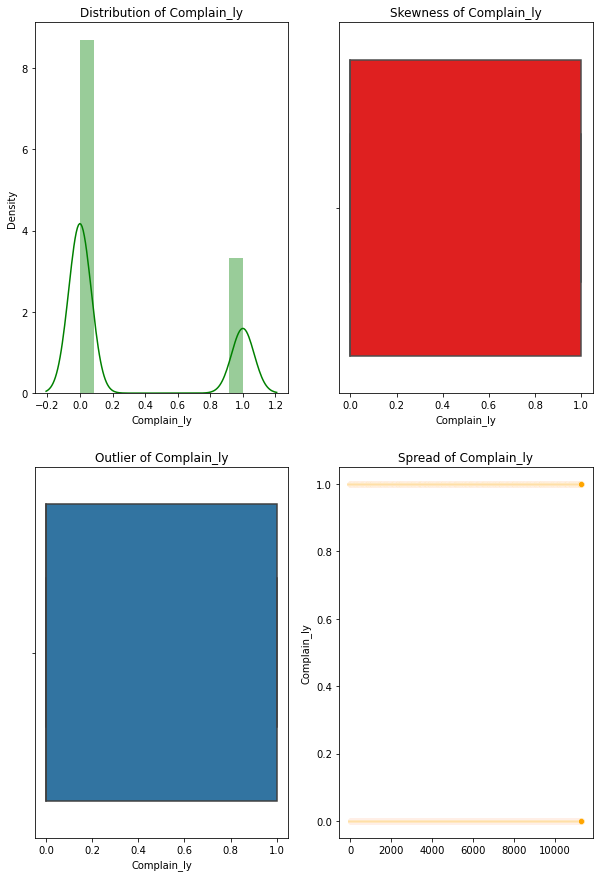

In [151]:
univariateAnalysis_numeric('Complain_ly')

In [152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11260 non-null  int32  
 3   City_Tier                11260 non-null  object 
 4   CC_Contacted_LY          11260 non-null  float64
 5   Payment                  11260 non-null  object 
 6   Gender                   11260 non-null  object 
 7   Service_Score            11260 non-null  float64
 8   Account_user_count       11260 non-null  int64  
 9   account_segment          11260 non-null  object 
 10  CC_Agent_Score           11260 non-null  float64
 11  Marital_Status           11260 non-null  object 
 12  rev_per_month            11260 non-null  int64  
 13  Complain_ly              11260 non-null  float64
 14  rev_growth_yoy        

In [153]:
df[df['Login_device'].isnull()]

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
39,20039,0,0,1.0,9.0,Others,M,3.0,4,Regular Plus,3.0,Married,2,1.0,15.0,0,1,125.66,NaN
49,20049,0,18,3.0,10.0,Others,F,1.0,3,Super,5.0,Married,5,1.0,11.0,0,3,150.06,NaN
53,20053,0,19,3.0,6.0,E wallet,F,3.0,3,HNI,5.0,Married,2,0.0,25.0,4,7,204.53,NaN
75,20075,0,0,1.0,6.0,Others,M,2.0,4,Super,5.0,Divorced,6,0.0,19.0,0,0,142.98,NaN
88,20088,0,24,1.0,14.0,Debit Card,M,2.0,4,HNI,4.0,Divorced,6,0.0,16.0,1,7,224.90,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11168,31168,0,16,3.0,21.0,E wallet,M,4.0,4,Super,1.0,Married,6,1.0,15.0,2,1,180.87,NaN
11185,31185,1,1,3.0,40.0,E wallet,M,4.0,4,Super,1.0,Married,5,1.0,13.0,1,9,185.17,NaN
11197,31197,0,1,1.0,10.0,Debit Card,M,3.0,4,Super,3.0,Single,6,0.0,15.0,2,3,175.17,NaN
11240,31240,0,9,2.0,38.0,Debit Card,F,3.0,4,HNI,1.0,Single,3,1.0,17.0,2,8,213.37,NaN


In [154]:
df['Login_device'].value_counts(dropna=False)

Mobile      7482
Computer    3018
NaN          760
Name: Login_device, dtype: int64

In [155]:
df['Login_device'].replace(np.nan,'Others',inplace=True)

In [156]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
AccountID,11260.0,NaN,NaN,NaN,25629.5,3250.62635,20000.0,22814.75,25629.5,28444.25,31259.0
Churn,11260.0,NaN,NaN,NaN,0.168384,0.374223,0.0,0.0,0.0,0.0,1.0
Tenure,11260.0,NaN,NaN,NaN,10.811634,12.84464,0.0,2.0,8.0,16.0,99.0
City_Tier,11260.0,4.0,1.0,7263.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Contacted_LY,11260.0,NaN,NaN,NaN,17.867091,8.813075,4.0,11.0,16.0,23.0,132.0
Payment,11260,6,Debit Card,4587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,11260,3,M,6704,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,11260.0,NaN,NaN,NaN,2.903375,0.722476,0.0,2.0,3.0,3.0,5.0
Account_user_count,11260.0,NaN,NaN,NaN,3.704973,1.004383,1.0,3.0,4.0,4.0,6.0
account_segment,11260,5,Regular Plus,4221,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [157]:
null_propotiondf[null_propotiondf['Null Value']!=0]

,Columns Type,Null Value,Percentage
Tenure,object,218,1.94
City_Tier,float64,112,0.99
CC_Contacted_LY,float64,102,0.91
Payment,object,109,0.97
Gender,object,108,0.96
Service_Score,float64,98,0.87
Account_user_count,object,444,3.94
CC_Agent_Score,float64,116,1.03
Marital_Status,object,212,1.88
rev_per_month,object,791,7.02


In [158]:
clean_df=df

In [159]:
df=df.drop('AccountID',axis=1)

# Duplicate Checking

In [160]:
df[df.duplicated()]

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
1347,1,0,1.0,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7,1.0,15.0,0,0,120.90,Mobile
1395,1,11,1.0,6.0,Debit Card,M,3.0,4,HNI,3.0,Single,10,1.0,13.0,0,0,153.81,Mobile
1456,1,0,1.0,13.0,Debit Card,M,3.0,5,Super,3.0,Single,2,1.0,24.0,1,6,160.74,Computer
1485,1,0,1.0,15.0,Credit Card,F,2.0,3,Regular Plus,5.0,Single,8,0.0,22.0,1,4,142.00,Mobile
1498,0,18,1.0,15.0,Debit Card,M,2.0,3,Super,4.0,Married,9,0.0,18.0,1,15,123.48,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5584,0,9,1.0,16.0,Credit Card,M,3.0,4,Super,3.0,Single,3,0.0,20.0,1,9,175.98,Mobile
5604,1,20,1.0,14.0,Cash on Delivery,M,4.0,4,Regular Plus,3.0,Married,10,0.0,12.0,7,9,148.39,Mobile
5605,0,15,1.0,35.0,Debit Card,F,3.0,5,Super Plus,4.0,Married,2,0.0,24.0,2,11,260.70,Mobile
5611,0,12,3.0,17.0,Debit Card,F,4.0,4,Super,1.0,Married,3,0.0,12.0,1,10,178.43,Mobile


In [161]:
df=df.drop_duplicates()

In [162]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  int32  
 2   City_Tier                10976 non-null  object 
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  object 
 5   Gender                   10976 non-null  object 
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  object 
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  object 
 11  rev_per_month            10976 non-null  int64  
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [163]:
df['City_Tier']=df['City_Tier'].astype('int64')

                                             |          | [  0%]   00:00 -> (? left)

Report EDA_sweetviz.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



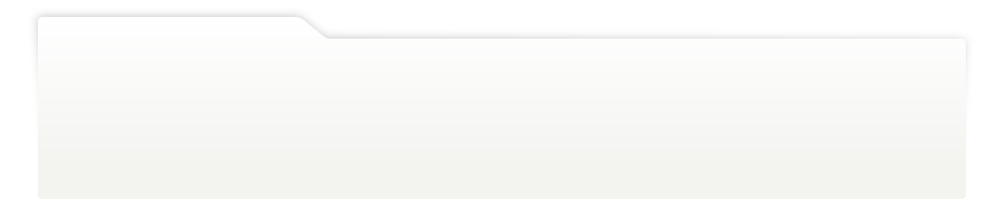
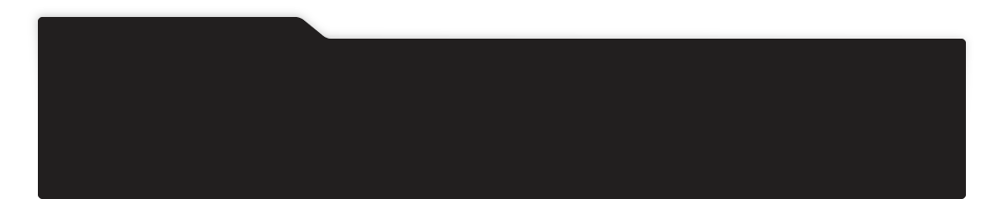
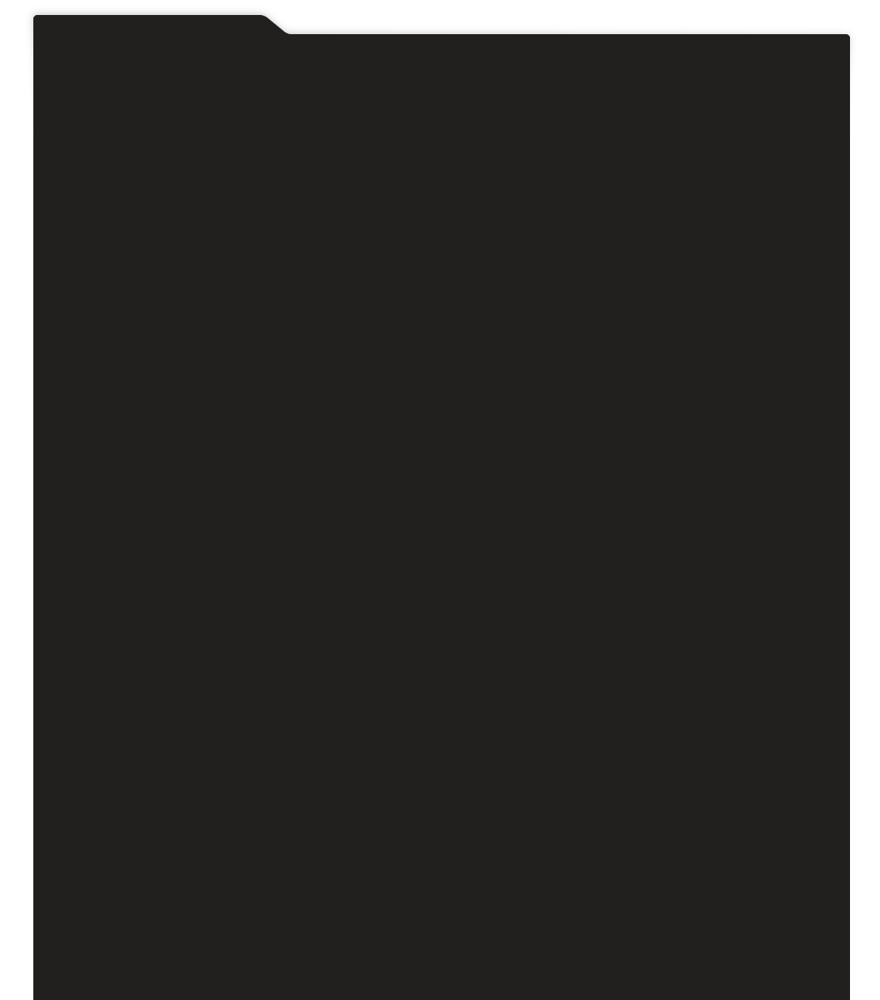
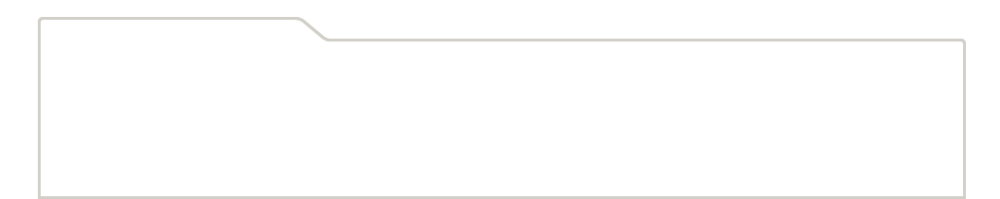
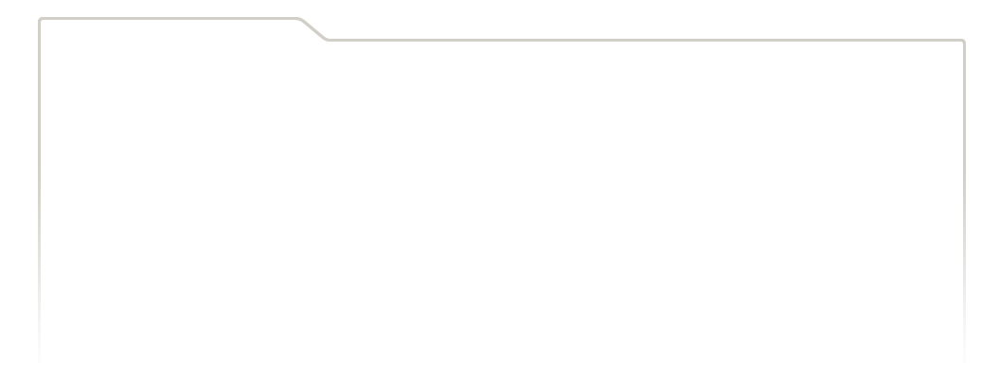
...
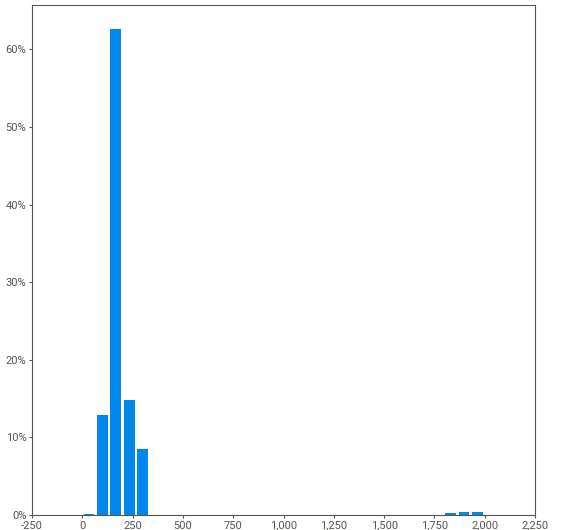
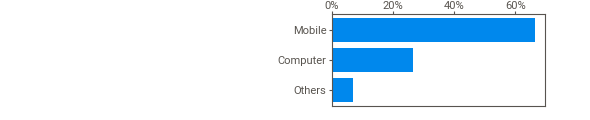
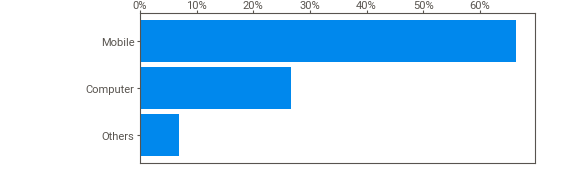
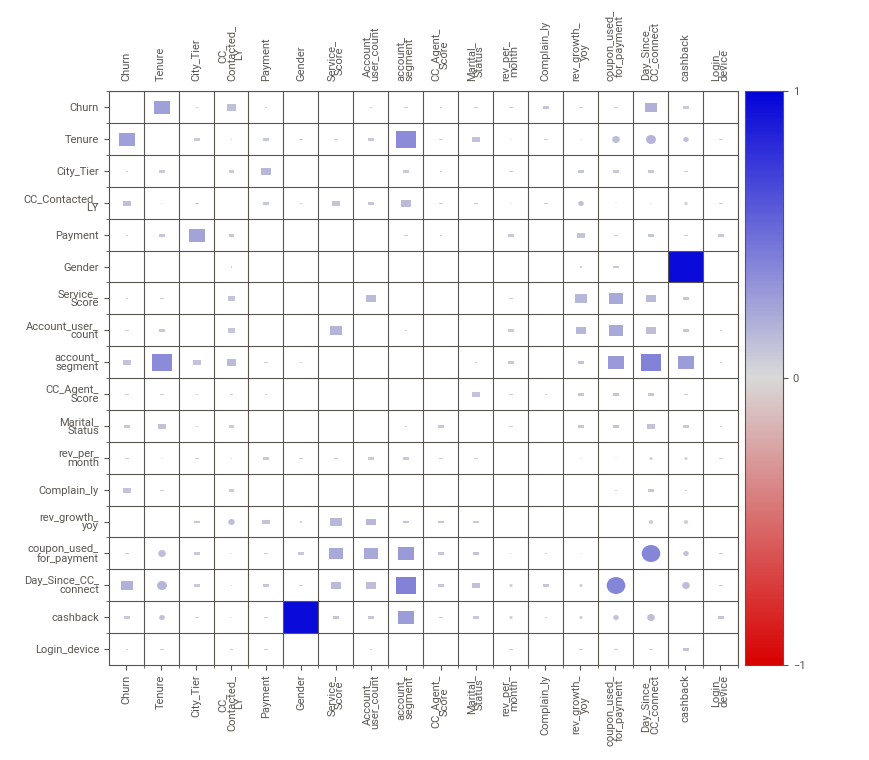
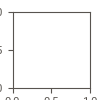

Report 'C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_maindata.html' was saved to storage.


In [164]:
import sweetviz as sv

eda_report_1 = sv.analyze(df)
eda_report_1.show_html('EDA_sweetviz.html')
eda_report_1.show_notebook(w=None, h=None,scale=None,layout='vertical',
filepath='C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_maindata.html')

# Univariate Analysis

In [165]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Churn,10976.0,NaN,NaN,NaN,0.168185,0.374048,0.0,0.0,0.0,0.0,1.0
Tenure,10976.0,NaN,NaN,NaN,10.858145,12.945317,0.0,2.0,8.0,16.0,99.0
City_Tier,10976.0,NaN,NaN,NaN,1.648415,0.913789,1.0,1.0,1.0,3.0,3.0
CC_Contacted_LY,10976.0,NaN,NaN,NaN,17.898,8.831955,4.0,11.0,16.0,23.0,132.0
Payment,10976,6,Debit Card,4474,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,10976,3,M,6533,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,10976.0,NaN,NaN,NaN,2.901421,0.722898,0.0,2.0,3.0,3.0,5.0
Account_user_count,10976.0,NaN,NaN,NaN,3.704628,1.0047,1.0,3.0,4.0,4.0,6.0
account_segment,10976,5,Regular Plus,4099,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CC_Agent_Score,10976.0,NaN,NaN,NaN,3.056396,1.373358,1.0,2.0,3.0,4.0,5.0


In [166]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  int32  
 2   City_Tier                10976 non-null  int64  
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  object 
 5   Gender                   10976 non-null  object 
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  object 
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  object 
 11  rev_per_month            10976 non-null  int64  
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [167]:
num_col=list(df.select_dtypes(['int64','float64','int32']).columns)
num_col

['Churn',
 'Tenure',
 'City_Tier',
 'CC_Contacted_LY',
 'Service_Score',
 'Account_user_count',
 'CC_Agent_Score',
 'rev_per_month',
 'Complain_ly',
 'rev_growth_yoy',
 'coupon_used_for_payment',
 'Day_Since_CC_connect',
 'cashback']

Univariate of Tenure
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


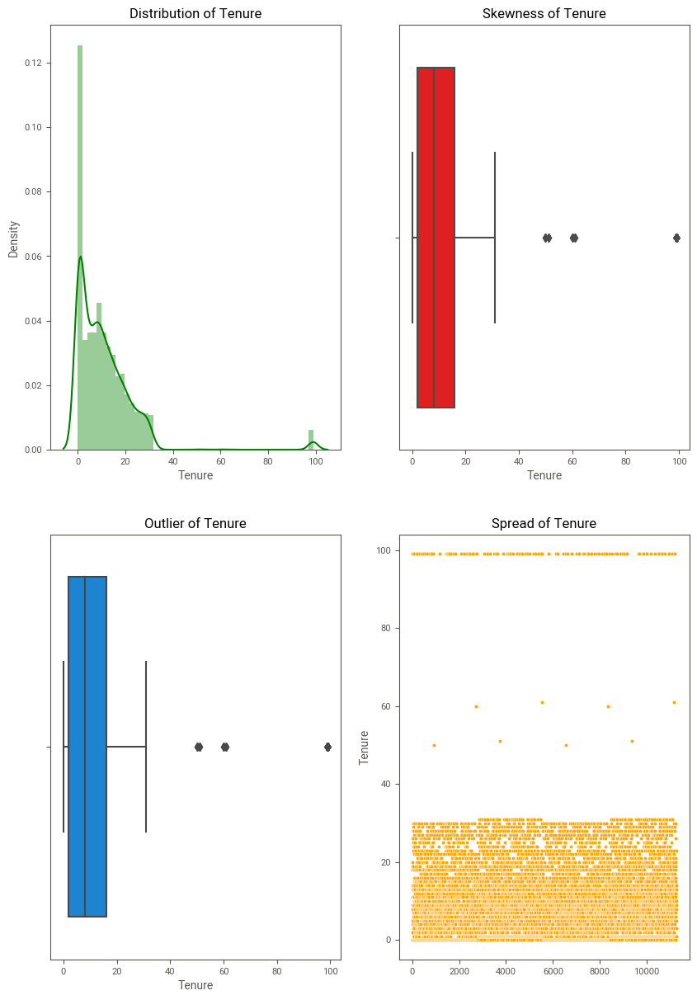

In [168]:
univariateAnalysis_numeric('Tenure')

Univariate of CC_Contacted_LY
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


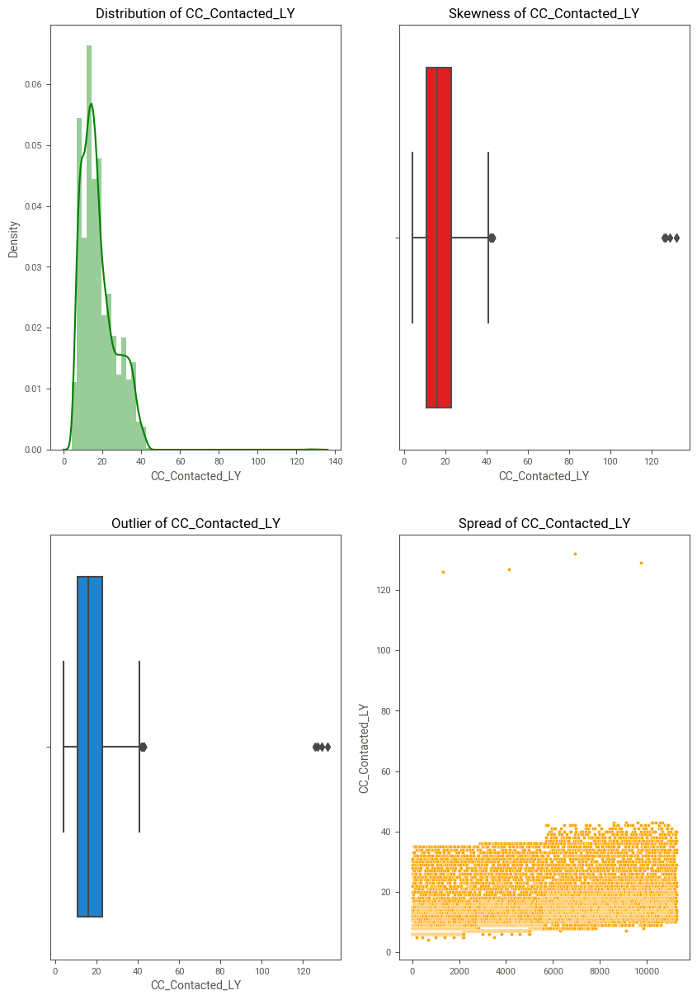

In [169]:
univariateAnalysis_numeric('CC_Contacted_LY')

In [170]:
df['coupon_used_for_payment'].value_counts(dropna=False)

1     4246
2     2589
0     2085
3      690
4      419
5      280
6      232
7      183
8       88
9       34
10      34
11      30
12      26
13      21
14      11
15       4
16       4
Name: coupon_used_for_payment, dtype: int64

Univariate of Service_Score
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


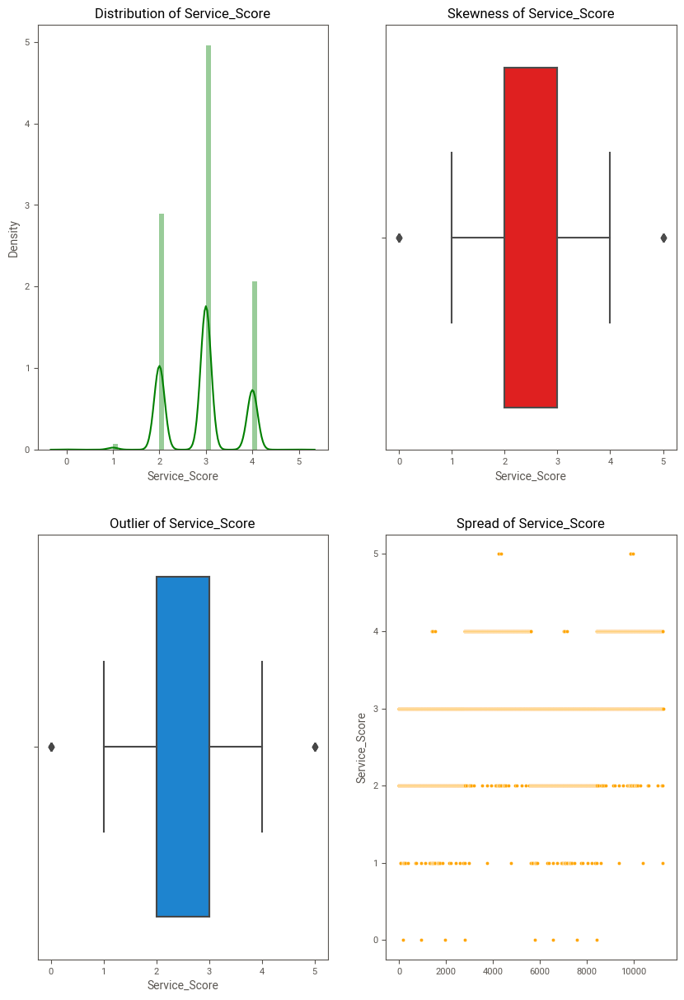

In [171]:
univariateAnalysis_numeric('Service_Score')

Univariate of rev_per_month
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


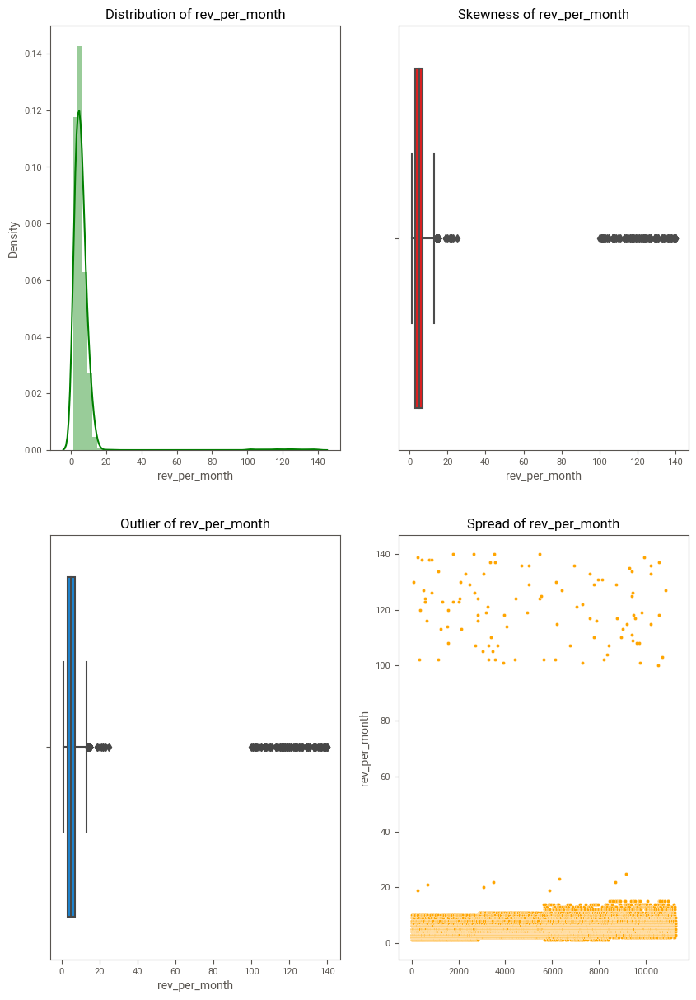

In [172]:

univariateAnalysis_numeric('rev_per_month')

Univariate of CC_Agent_Score
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


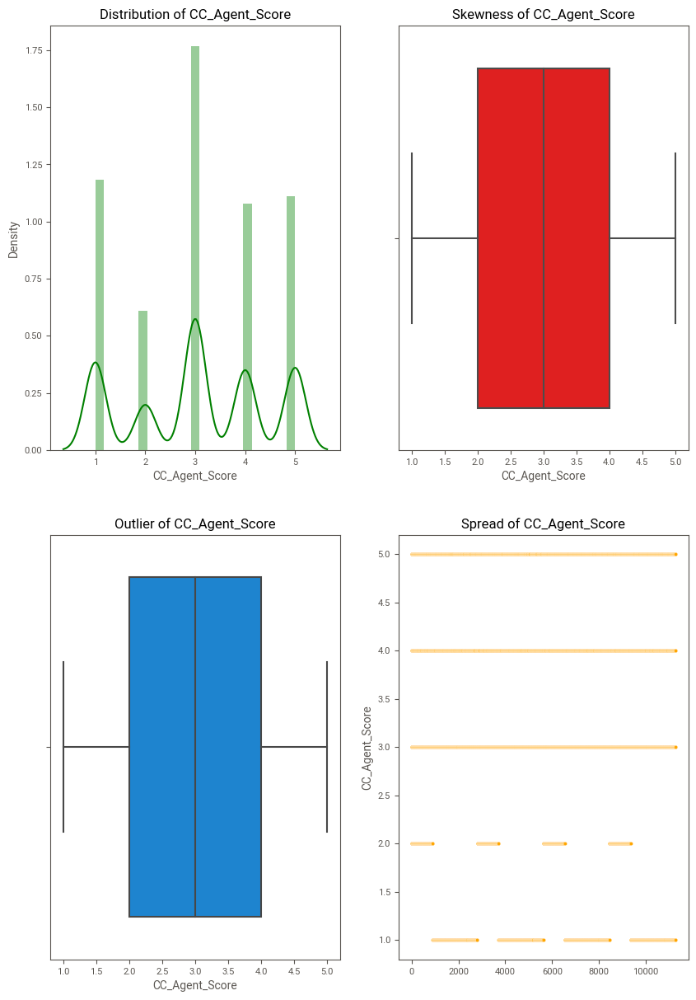

In [173]:

univariateAnalysis_numeric('CC_Agent_Score')

Univariate of Account_user_count
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


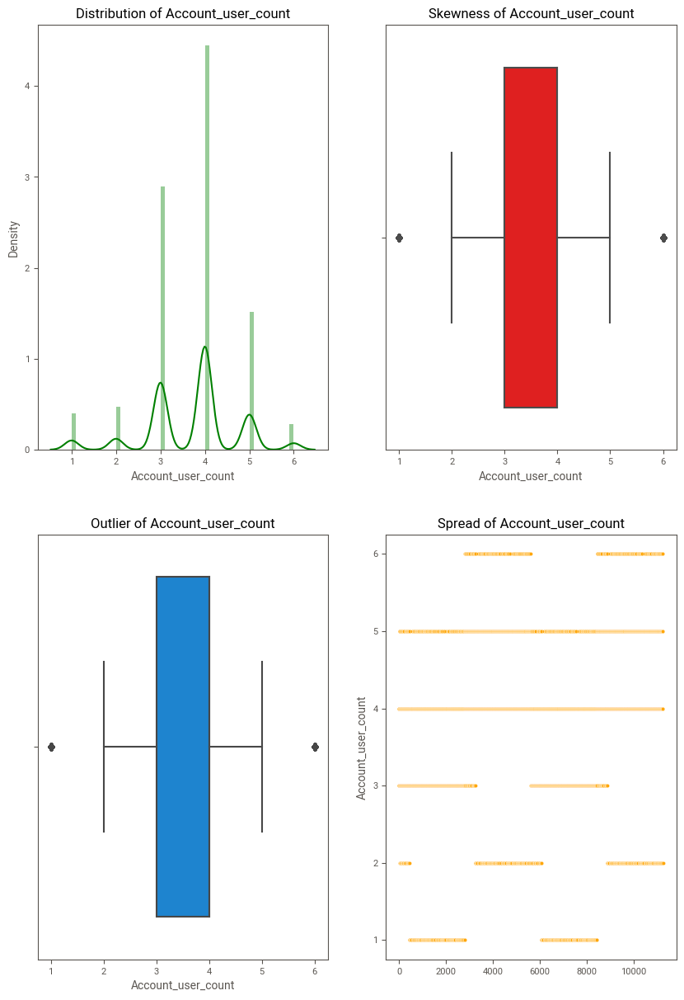

In [174]:

univariateAnalysis_numeric('Account_user_count')

Univariate of cashback
----------------------------------------------------------------------------


C:\Users\vino_\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


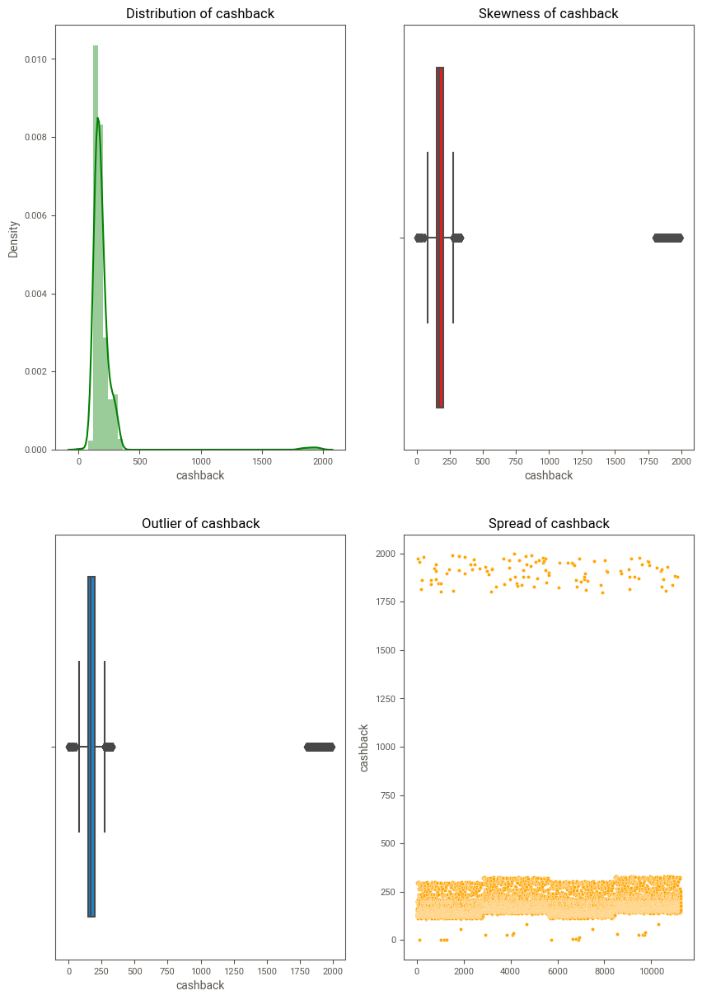

In [175]:
univariateAnalysis_numeric('cashback')

# Outlier Treatment

In [176]:
def detect_outlers(col_nm):
    Q1 = np.percentile(df[col_nm], 25,interpolation = 'midpoint')
    Q3 = np.percentile(df[col_nm], 75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    # Upper bound
    upper = np.where(df[col_nm] >= (Q3+1.5*IQR))
    # Lower bound
    lower = np.where(df[col_nm] <= (Q1-1.5*IQR))
    total_outliers=upper[0].shape+lower[0].shape
    tot_obs=df[col_nm].count()
    if IQR==0 & total_outliers[0]==0:
        pct_out=0.00
        print('Total Outliers in',col_nm, 'is',0,'.Percentage of outliers is',pct_out,'%')
    else:
        pct_out=((total_outliers[0]/tot_obs)*100).round(2)
        print('Total Outliers in',col_nm, 'is',total_outliers[0],'.Percentage of outliers is',pct_out,'%')
    

In [177]:
for i in num_col:
    detect_outlers(i)

Total Outliers in Churn is 0 .Percentage of outliers is 0.0 %
Total Outliers in Tenure is 139 .Percentage of outliers is 1.27 %
Total Outliers in City_Tier is 0 .Percentage of outliers is 0.0 %
Total Outliers in CC_Contacted_LY is 71 .Percentage of outliers is 0.65 %
Total Outliers in Service_Score is 5 .Percentage of outliers is 0.05 %
Total Outliers in Account_user_count is 305 .Percentage of outliers is 2.78 %
Total Outliers in CC_Agent_Score is 0 .Percentage of outliers is 0.0 %
Total Outliers in rev_per_month is 278 .Percentage of outliers is 2.53 %
Total Outliers in Complain_ly is 0 .Percentage of outliers is 0.0 %
Total Outliers in rev_growth_yoy is 14 .Percentage of outliers is 0.13 %
Total Outliers in coupon_used_for_payment is 1366 .Percentage of outliers is 12.45 %
Total Outliers in Day_Since_CC_connect is 128 .Percentage of outliers is 1.17 %
Total Outliers in cashback is 925 .Percentage of outliers is 8.43 %


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'Churn'),
  Text(1, 0, 'Tenure'),
  Text(2, 0, 'City_Tier'),
  Text(3, 0, 'CC_Contacted_LY'),
  Text(4, 0, 'Service_Score'),
  Text(5, 0, 'Account_user_count'),
  Text(6, 0, 'CC_Agent_Score'),
  Text(7, 0, 'rev_per_month'),
  Text(8, 0, 'Complain_ly'),
  Text(9, 0, 'rev_growth_yoy'),
  Text(10, 0, 'coupon_used_for_payment'),
  Text(11, 0, 'Day_Since_CC_connect'),
  Text(12, 0, 'cashback')])

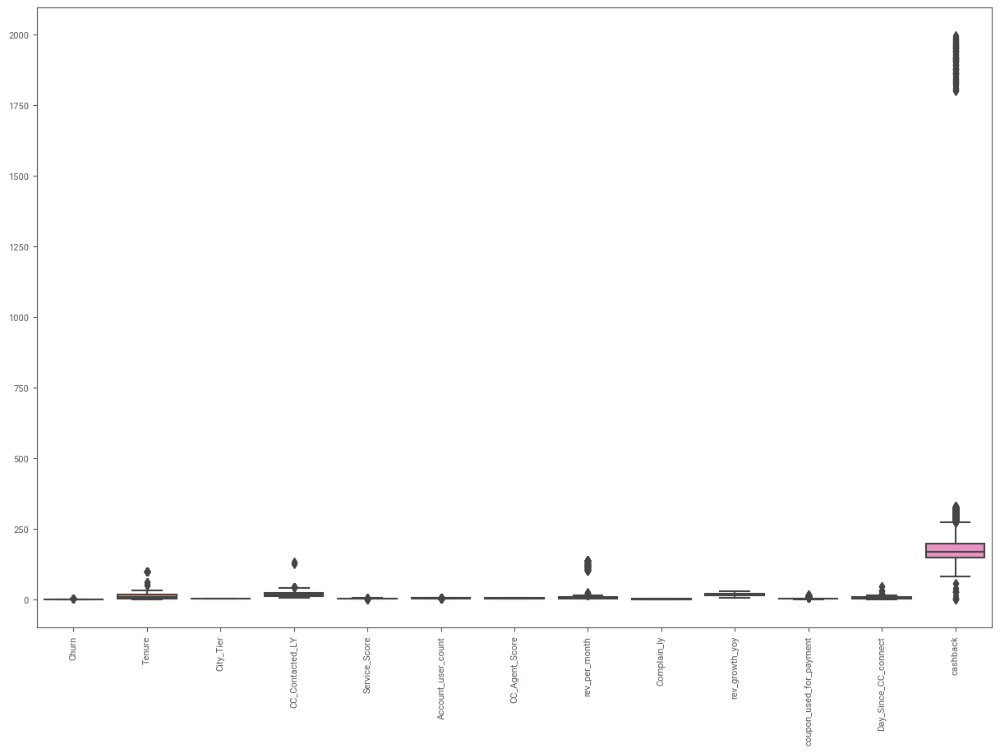

In [178]:
#f, ax = plt.subplots(figsize=(10,10))
#ax = sns.boxplot(data=df,width=0.8,palette="Set2",orient='h',linewidth=0.5)


plt.figure(figsize = (15,10))
box = sns.boxplot(data=df)
plt.xticks(rotation=90)

Treating Outlier which are above 2%

In [179]:
def treat_outlier(x):
    # taking 5,25,75 percentile of column
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    dt=np.percentile(x,95)
    #calculationg IQR range
    IQR=q75-q25
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Capping outliers
    return x.apply(lambda y: dt if y > upper_bound else y).apply(lambda y: q5 if y < lower_bound else y)

In [180]:
for i in ['cashback','Tenure','CC_Contacted_LY','rev_per_month','Service_Score']:    
    df[i]=treat_outlier(df[i])

# Bi-Variate Analysis

# BI-Variate Analyis Done in Tableau

In [181]:
df.to_csv('Final_data.csv')

C:\Users\vino_\AppData\Local\Temp/ipykernel_9544/3345069993.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


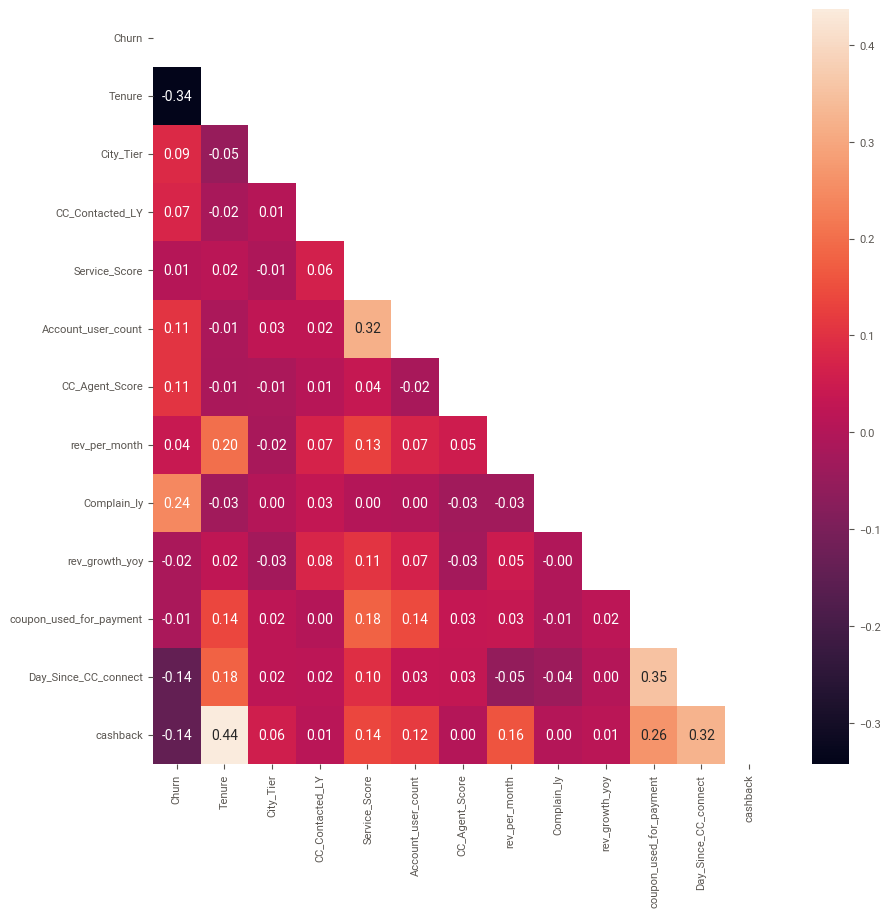

In [182]:
corr = df.corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=np.bool)) 
fig = plt.subplots(figsize=(10, 10))
sns.heatmap(df.corr(), annot=True,fmt='.2f',mask=mask)
plt.show()

In [183]:
df

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9.0,1.0,11.0,1,5,159.93000,Mobile
1,1,0.0,1,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7.0,1.0,15.0,0,0,120.90000,Mobile
2,1,0.0,1,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6.0,1.0,14.0,0,3,196.23637,Mobile
3,1,0.0,3,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8.0,0.0,23.0,0,3,134.07000,Mobile
4,1,0.0,1,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3.0,0.0,11.0,1,3,129.60000,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,0,10.0,1,34.0,Credit Card,M,3.0,2,Super,1.0,Married,9.0,0.0,19.0,1,4,153.71000,Computer
11256,0,13.0,1,19.0,Credit Card,M,3.0,5,HNI,5.0,Married,7.0,0.0,16.0,1,8,226.91000,Mobile
11257,0,1.0,1,14.0,Debit Card,M,3.0,2,Super,4.0,Married,7.0,1.0,22.0,1,4,191.42000,Mobile
11258,0,23.0,3,11.0,Credit Card,M,4.0,5,Super,4.0,Married,7.0,0.0,16.0,2,9,179.90000,Computer


In [184]:
pd.crosstab(df.Churn,df.Complain_ly)

Complain_ly,0.0,1.0
Churn,,
0,7058,2072
1,887,959


In [185]:
pd.crosstab(df.Churn,df.Complain_ly,normalize=True)*100

Complain_ly,0.0,1.0
Churn,,
0,64.303936,18.877551
1,8.081268,8.737245


In [186]:
pd.crosstab(df.account_segment,df.Complain_ly,normalize=True)*100

Complain_ly,0.0,1.0
account_segment,,
HNI,10.532070,4.145408
Regular,3.516764,1.138848
Regular Plus,26.767493,10.577624
Super,26.466837,9.538994
Super Plus,5.102041,2.213921


# Clustering

In [187]:
cluster_df=df.drop('Churn',axis=1)
cluster_df.head()

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,4.0,3,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9.0,1.0,11.0,1,5,159.93000,Mobile
1,0.0,1,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7.0,1.0,15.0,0,0,120.90000,Mobile
2,0.0,1,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6.0,1.0,14.0,0,3,196.23637,Mobile
3,0.0,3,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8.0,0.0,23.0,0,3,134.07000,Mobile
4,0.0,1,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3.0,0.0,11.0,1,3,129.60000,Mobile


In [188]:
import category_encoders as ce


In [189]:
cluster_df

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,4.0,3,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9.0,1.0,11.0,1,5,159.93000,Mobile
1,0.0,1,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7.0,1.0,15.0,0,0,120.90000,Mobile
2,0.0,1,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6.0,1.0,14.0,0,3,196.23637,Mobile
3,0.0,3,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8.0,0.0,23.0,0,3,134.07000,Mobile
4,0.0,1,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3.0,0.0,11.0,1,3,129.60000,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,10.0,1,34.0,Credit Card,M,3.0,2,Super,1.0,Married,9.0,0.0,19.0,1,4,153.71000,Computer
11256,13.0,1,19.0,Credit Card,M,3.0,5,HNI,5.0,Married,7.0,0.0,16.0,1,8,226.91000,Mobile
11257,1.0,1,14.0,Debit Card,M,3.0,2,Super,4.0,Married,7.0,1.0,22.0,1,4,191.42000,Mobile
11258,23.0,3,11.0,Credit Card,M,4.0,5,Super,4.0,Married,7.0,0.0,16.0,2,9,179.90000,Computer


In [190]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  float64
 2   City_Tier                10976 non-null  int64  
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  object 
 5   Gender                   10976 non-null  object 
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  object 
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  object 
 11  rev_per_month            10976 non-null  float64
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [191]:
cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Tenure                   10976 non-null  float64
 1   City_Tier                10976 non-null  int64  
 2   CC_Contacted_LY          10976 non-null  float64
 3   Payment                  10976 non-null  object 
 4   Gender                   10976 non-null  object 
 5   Service_Score            10976 non-null  float64
 6   Account_user_count       10976 non-null  int64  
 7   account_segment          10976 non-null  object 
 8   CC_Agent_Score           10976 non-null  float64
 9   Marital_Status           10976 non-null  object 
 10  rev_per_month            10976 non-null  float64
 11  Complain_ly              10976 non-null  float64
 12  rev_growth_yoy           10976 non-null  float64
 13  coupon_used_for_payment  10976 non-null  int64  
 14  Day_Since_CC_connect  

In [192]:
cluster_df['Tenure']=cluster_df['Tenure'].astype('int')


In [193]:
cluster_df['CC_Contacted_LY']=cluster_df['CC_Contacted_LY'].astype('int')


In [194]:
cluster_df['Service_Score']=cluster_df['Service_Score'].astype('int')


In [195]:
cluster_df['CC_Agent_Score']=cluster_df['CC_Agent_Score'].astype('int')


In [196]:
cluster_df['rev_per_month']=cluster_df['rev_per_month'].astype('int')


In [197]:
cluster_df['rev_growth_yoy']=cluster_df['rev_growth_yoy'].astype('int')


In [198]:
cluster_df.isnull().sum()

Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

,Tenure,City_Tier,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback
0.25,2.0,1.0,11.0,2.0,3.0,2.0,3.0,0.9,13.0,1.0,2.0,148.0875
0.75,16.0,3.0,23.0,3.0,4.0,4.0,7.0,1.0,19.0,2.0,7.0,198.1300
0.95,28.0,3.0,35.0,4.0,5.0,5.0,11.0,1.0,24.0,6.0,11.0,296.0250


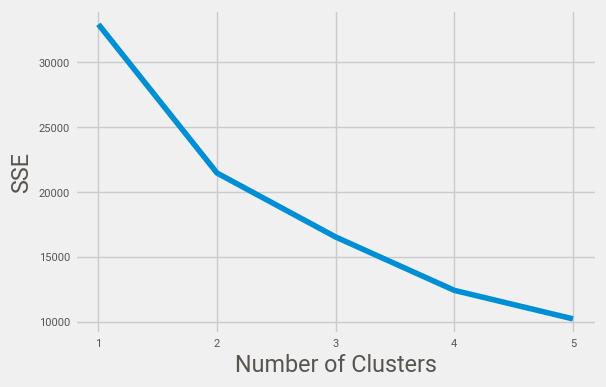

In [199]:
import matplotlib.pyplot as plt
# from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
cols_to_consider = ["Tenure","rev_per_month",'cashback']
cluster_df.fillna(0, inplace = True )
cluster_df.replace(0, 0.9 ,inplace = True )
thresh = cluster_df.quantile([.25,.75, 0.95])
display(thresh)
cluster_df = cluster_df.clip(upper=thresh.loc[.95],axis=1)
cluster_df = cluster_df[cols_to_consider].apply(pd.to_numeric)
cluster_df = np.log(cluster_df)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(cluster_df)
kmeans = KMeans(
    init="random",
    n_clusters=7,
    n_init=10,
    max_iter=300,
    random_state=42
)
kmeans.fit(scaled_features)
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}
# A list holds the SSE values for each k
sse = []
for k in range(1, 6):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)
plt.style.use("fivethirtyeight")
plt.plot(range(1, 6), sse)
plt.xticks(range(1, 6))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()
predict=kmeans.predict(scaled_features)
cluster_df['segment_new'] = pd.Series(predict, index=cluster_df.index)

In [200]:
cluster_df.segment_new.unique()

array([3, 0, 2, 1, 4])

# Feature Encoding

In [201]:
df.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9.0,1.0,11.0,1,5,159.93000,Mobile
1,1,0.0,1,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7.0,1.0,15.0,0,0,120.90000,Mobile
2,1,0.0,1,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6.0,1.0,14.0,0,3,196.23637,Mobile
3,1,0.0,3,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8.0,0.0,23.0,0,3,134.07000,Mobile
4,1,0.0,1,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3.0,0.0,11.0,1,3,129.60000,Mobile


In [202]:
orig_df=df
orig_df.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3,6.0,Debit Card,F,3.0,3,Super,2.0,Single,9.0,1.0,11.0,1,5,159.93000,Mobile
1,1,0.0,1,8.0,UPI,M,3.0,4,Regular Plus,3.0,Single,7.0,1.0,15.0,0,0,120.90000,Mobile
2,1,0.0,1,30.0,Debit Card,M,2.0,4,Regular Plus,3.0,Single,6.0,1.0,14.0,0,3,196.23637,Mobile
3,1,0.0,3,15.0,Debit Card,M,2.0,4,Super,5.0,Single,8.0,0.0,23.0,0,3,134.07000,Mobile
4,1,0.0,1,12.0,Credit Card,M,2.0,3,Regular Plus,5.0,Single,3.0,0.0,11.0,1,3,129.60000,Mobile


In [203]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  float64
 2   City_Tier                10976 non-null  int64  
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  object 
 5   Gender                   10976 non-null  object 
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  object 
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  object 
 11  rev_per_month            10976 non-null  float64
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [204]:
orig_df=df

In [205]:
for feature in df.columns: 
    if df[feature].dtype == 'object': 
        print('\n')
        print('feature:',feature)
        print(pd.Categorical(df[feature].unique()))
        print(pd.Categorical(df[feature].unique()).codes)
        df[feature] = pd.Categorical(df[feature]).codes



feature: Payment
['Debit Card', 'UPI', 'Credit Card', 'Cash on Delivery', 'E wallet', 'Others']
Categories (6, object): ['Cash on Delivery', 'Credit Card', 'Debit Card', 'E wallet', 'Others', 'UPI']
[2 5 1 0 3 4]


feature: Gender
['F', 'M', 'No data']
Categories (3, object): ['F', 'M', 'No data']
[0 1 2]


feature: account_segment
['Super', 'Regular Plus', 'Regular', 'HNI', 'Super Plus']
Categories (5, object): ['HNI', 'Regular', 'Regular Plus', 'Super', 'Super Plus']
[3 2 1 0 4]


feature: Marital_Status
['Single', 'Divorced', 'Married', 'No Data']
Categories (4, object): ['Divorced', 'Married', 'No Data', 'Single']
[3 0 1 2]


feature: Login_device
['Mobile', 'Computer', 'Others']
Categories (3, object): ['Computer', 'Mobile', 'Others']
[1 0 2]


In [206]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  float64
 2   City_Tier                10976 non-null  int64  
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  int8   
 5   Gender                   10976 non-null  int8   
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  int8   
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  int8   
 11  rev_per_month            10976 non-null  float64
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [207]:
import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

In [208]:
orig_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10976 entries, 0 to 11259
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn                    10976 non-null  int64  
 1   Tenure                   10976 non-null  float64
 2   City_Tier                10976 non-null  int64  
 3   CC_Contacted_LY          10976 non-null  float64
 4   Payment                  10976 non-null  int8   
 5   Gender                   10976 non-null  int8   
 6   Service_Score            10976 non-null  float64
 7   Account_user_count       10976 non-null  int64  
 8   account_segment          10976 non-null  int8   
 9   CC_Agent_Score           10976 non-null  float64
 10  Marital_Status           10976 non-null  int8   
 11  rev_per_month            10976 non-null  float64
 12  Complain_ly              10976 non-null  float64
 13  rev_growth_yoy           10976 non-null  float64
 14  coupon_used_for_paymen

In [209]:
df_plot = orig_df.groupby('Gender').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['Gender'],
        y=df_plot['Churn'],
        width = [0.5, 0.5],
        marker=dict(
        color=['green', 'blue'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Gender',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [210]:
df_plot = orig_df.groupby('Payment').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['Payment'],
        y=df_plot['Churn'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Payment',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [211]:
df_plot = orig_df.groupby('account_segment').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['account_segment'],
        y=df_plot['Churn'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='account_segment'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [212]:
df_plot = orig_df.groupby('Marital_Status').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['Marital_Status'],
        y=df_plot['Churn'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Marital_Status'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [213]:
df_plot = orig_df.groupby('Login_device').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['Login_device'],
        y=df_plot['Churn'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Login_device'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [214]:
df_plot = orig_df.groupby('Tenure').Churn.mean().reset_index()
plot_data = [
    go.Scatter(
        x=df_plot['Tenure'],
        y=df_plot['Churn'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "Tenure"},
        title='Tenure based Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [215]:
df_plot = orig_df.groupby('rev_per_month').Churn.mean().reset_index()
plot_data = [
    go.Scatter(
        x=df_plot['rev_per_month'],
        y=df_plot['Churn'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "rev_per_month"},
        title='rev_per_month based Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

# Data Split

In [216]:
X = df.drop("Churn", axis=1)
y = df.pop("Churn")

In [217]:
from sklearn.model_selection import train_test_split
X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=0.3, random_state=1)

In [218]:
print('X_train',X_train.shape)
print('X_test',X_test.shape)
print('train_labels',train_labels.shape)
print('test_labels',test_labels.shape)

X_train (7683, 17)
X_test (3293, 17)
train_labels (7683,)
test_labels (3293,)


# Variable Selection

Using VIF

In [219]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif_df = pd.DataFrame()
vif_df["feature"] = X_train.columns

In [220]:
vif_df["VIF"] = [variance_inflation_factor(X_train.values,i)
                        for i in range(len(X_train.columns))]


In [221]:
print(vif_df.sort_values(by='VIF',ascending=False))

                    feature        VIF
15                 cashback  19.615675
5             Service_Score  18.929575
12           rev_growth_yoy  16.113951
6        Account_user_count  15.487549
8            CC_Agent_Score   5.547041
2           CC_Contacted_LY   5.323646
10            rev_per_month   4.974750
7           account_segment   4.502262
1                 City_Tier   4.382016
3                   Payment   3.416205
14     Day_Since_CC_connect   3.257308
16             Login_device   3.121024
0                    Tenure   3.022440
9            Marital_Status   2.824896
4                    Gender   2.456699
13  coupon_used_for_payment   2.225393
11              Complain_ly   1.389644


In [222]:
X_train = X_train.drop(["cashback","Service_Score",'rev_growth_yoy',"Account_user_count"], axis=1)
X_test = X_test.drop(["cashback","Service_Score",'rev_growth_yoy',"Account_user_count"], axis=1)

In [223]:
vif_df = pd.DataFrame()
vif_df["feature"] = X_train.columns
#
# Calculate VIF for each feature
vif_df["VIF"] = [variance_inflation_factor(X_train.values,i)
                        for i in range(len(X_train.columns))]
print(vif_df.sort_values(by='VIF',ascending=False))

                    feature       VIF
6            CC_Agent_Score  5.021286
2           CC_Contacted_LY  4.778956
8             rev_per_month  4.495077
5           account_segment  4.270302
1                 City_Tier  4.128142
3                   Payment  3.321839
12             Login_device  3.004381
11     Day_Since_CC_connect  2.970579
7            Marital_Status  2.643970
0                    Tenure  2.492243
4                    Gender  2.303518
10  coupon_used_for_payment  2.126970
9               Complain_ly  1.368776


Using p-values


In [224]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

In [225]:
col = X_train.columns
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.Logit(train_labels.astype(float),X_train_sm.astype(float), family = sm.families.Binomial())
res = logm2.fit()
res.summary()

Optimization terminated successfully.
         Current function value: 0.309227
         Iterations 8


C:\Users\vino_\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 7683
Model:                          Logit   Df Residuals:                     7669
Method:                           MLE   Df Model:                           13
Date:                Wed, 22 Jun 2022   Pseudo R-squ.:                  0.3145
Time:                        21:06:11   Log-Likelihood:                -2375.8
converged:                       True   LL-Null:                       -3465.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -3.1144      0.213    -14.604      0.000      -3.532      -2.696
Tenure                     -0.1862      0.008    -24.586      0.000      -0.201      -0.171
City_Tier                   0.3253      0.040      8.133      0.000       0.247       0.404
CC_Contacted_LY             0.0237      0.004      5.392      0.000       0.015       0.032
Payment                    -0.0210      0.031     -0.689      0.491      -0.081       0.039
Gender                      0.2607      0.074      3.536      0.000       0.116       0.405
account_segment            -0.3674      0.037     -9.954      0.000      -0.440      -0.295
CC_Agent_Score              0.2844      0.027     10.374      0.000       0.231       0.338
Marital_Status              0.3597      0.033     10.774      0.000       0.294       0.425
rev_per_month               0.1231      0.013      9.309      0.000       0.097       0.149
Complain_ly                 1.6064      0.077     20.835      0.000       1.455       1.757
coupon_used_for_payment     0.1420      0.022      6.322      0.000       0.098       0.186
Day_Since_CC_connect       -0.1124      0.014     -8.256      0.000      -0.139      -0.086
Login_device               -0.2329      0.068     -3.406      0.001      -0.367      -0.099
===========================================================================================
"""

In [226]:
X_train = X_train.drop(['Payment'],axis=1)
X_test = X_test.drop(['Payment'],axis=1)

In [227]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
#
chi2_features = SelectKBest(score_func = chi2, k = "all")
X_train_kbest = chi2_features.fit(X_train, train_labels)
#
X_train_scores = pd.DataFrame(X_train_kbest.scores_,columns=["Score"])
X_train_columns = pd.DataFrame(X_train.columns)
#
X_train_features_rank = pd.concat([X_train_columns,X_train_scores],axis=1)
#
X_train_features_rank.columns = ['Features','Score']
X_train_features_rank

,Features,Score
0,Tenure,6708.493137
1,City_Tier,28.741766
2,CC_Contacted_LY,189.211504
3,Gender,1.653080
4,account_segment,27.436806
5,CC_Agent_Score,57.802617
6,Marital_Status,151.164699
7,rev_per_month,12.299899
8,Complain_ly,332.552963
9,coupon_used_for_payment,9.636750


                                             |          | [  0%]   00:00 -> (? left)


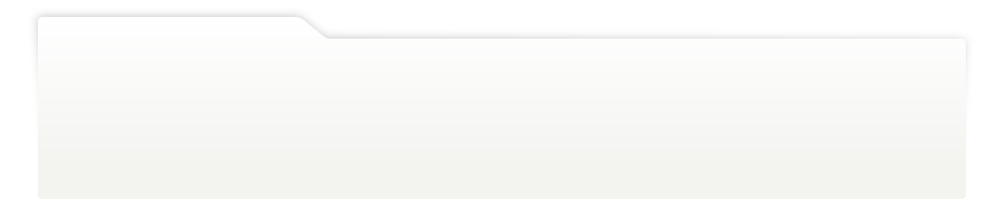
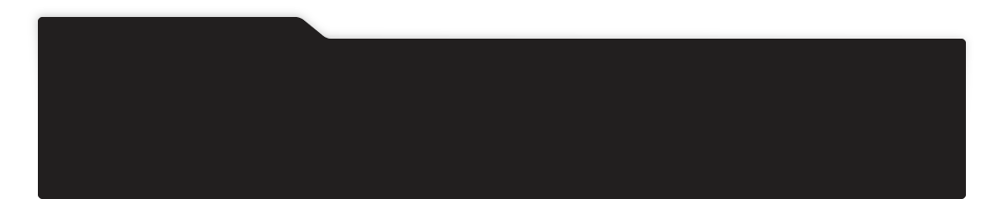
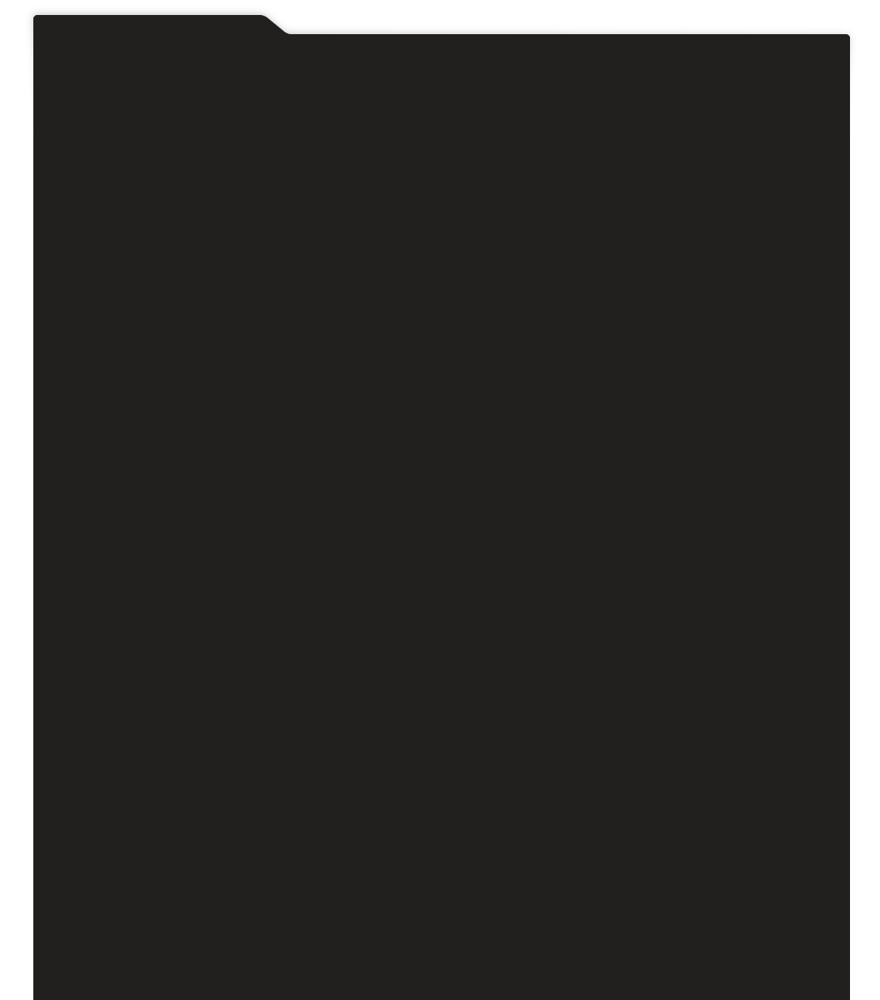
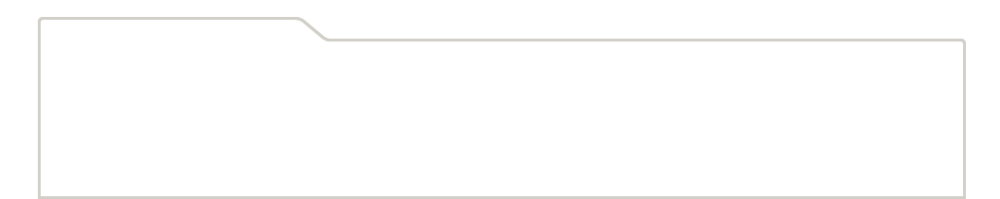
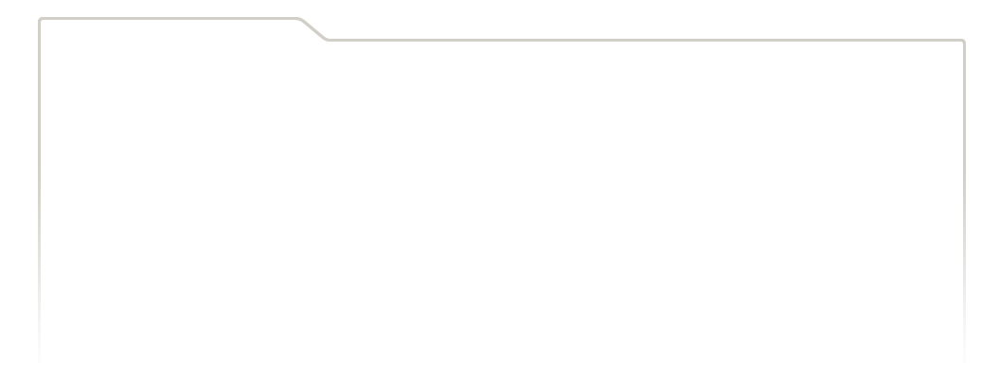
...
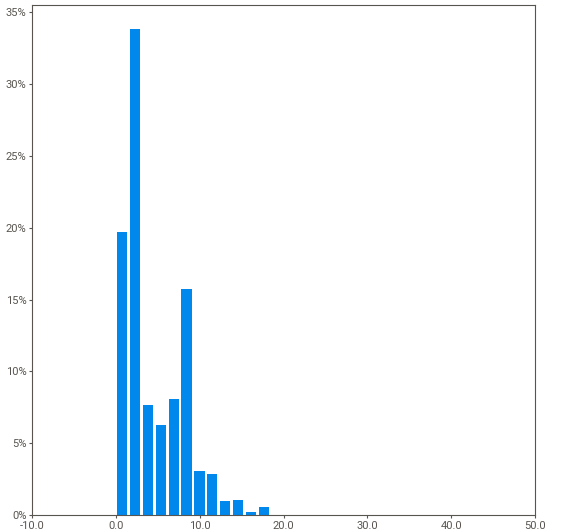
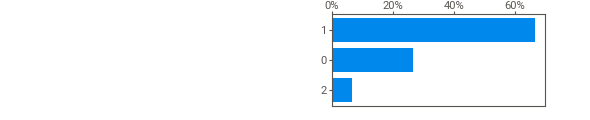
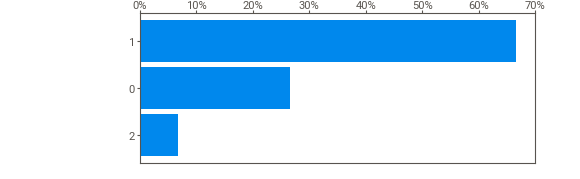
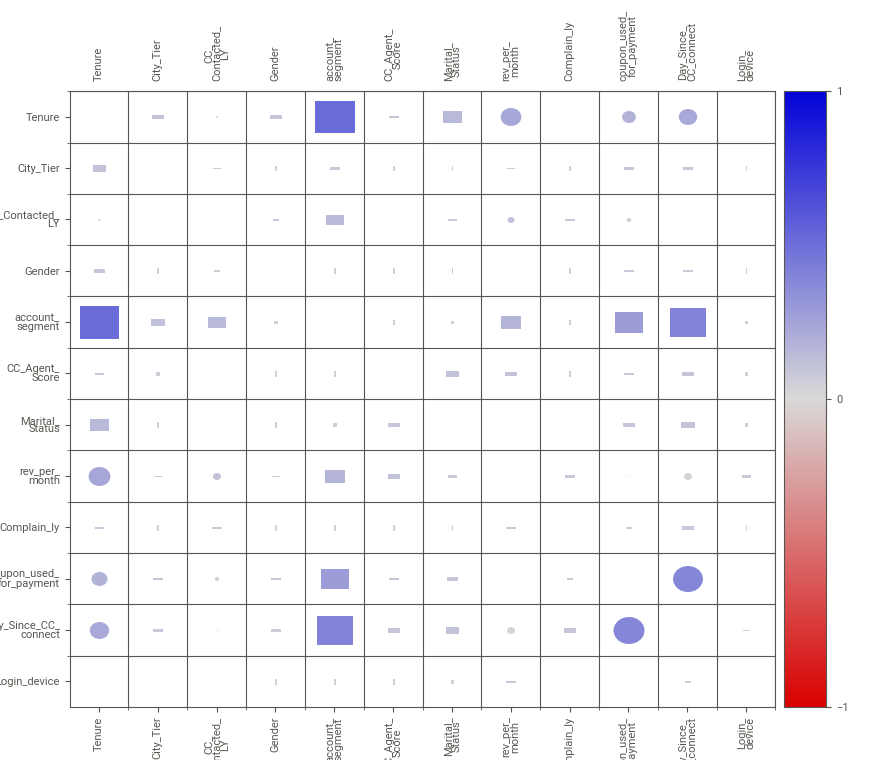
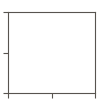

Report 'C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_Xtrain.html' was saved to storage.


In [228]:
import sweetviz as sv
eda_report_2 = sv.analyze(X_train)
eda_report_2.show_notebook(w=None, h=None,scale=None,layout='vertical',
filepath='C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_Xtrain.html')

                                             |          | [  0%]   00:00 -> (? left)


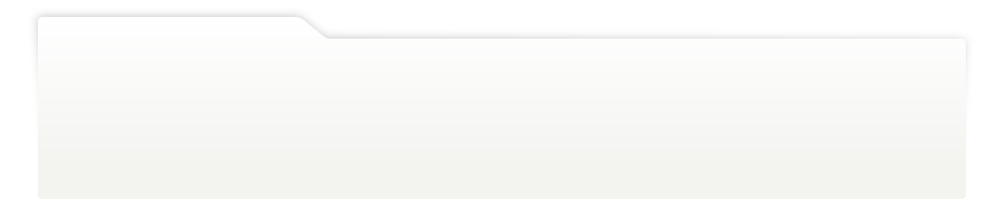
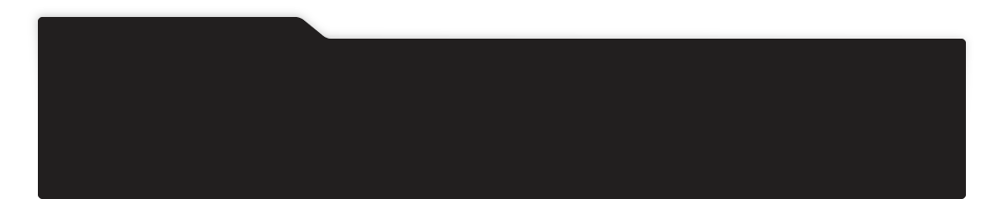
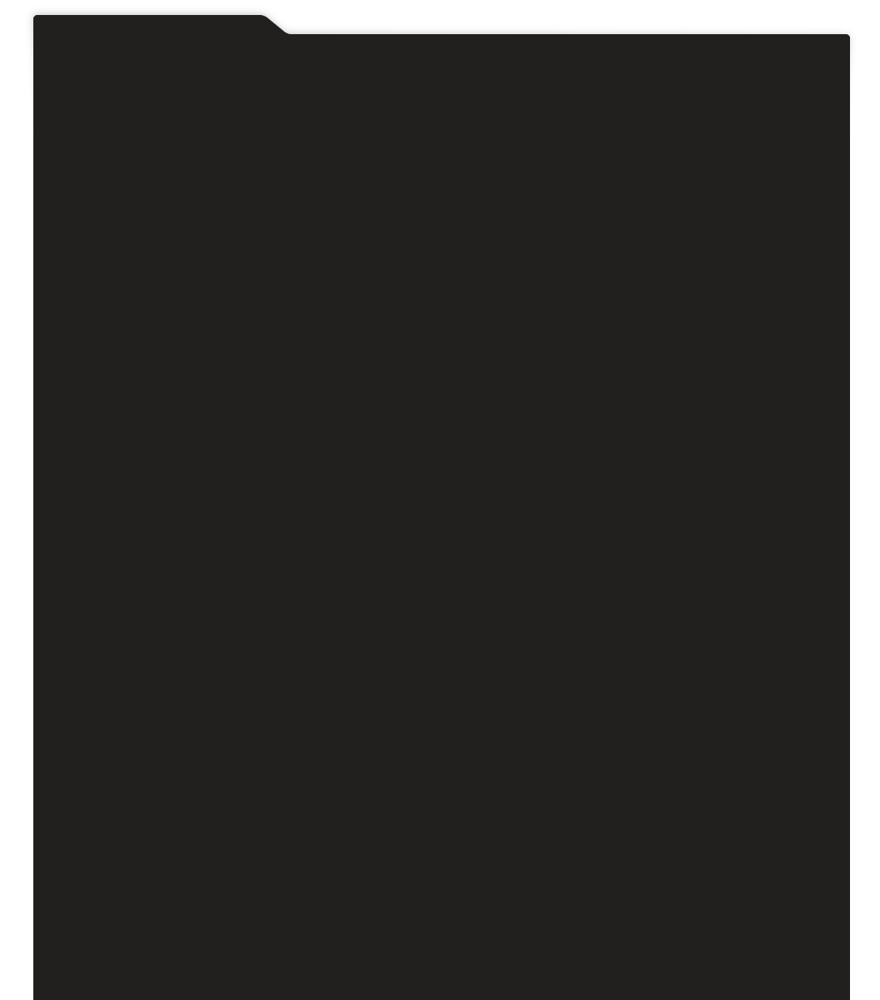
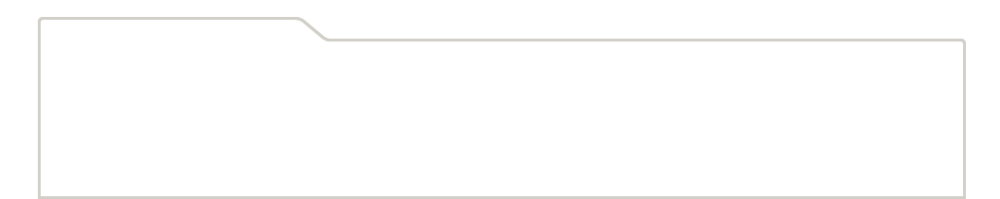
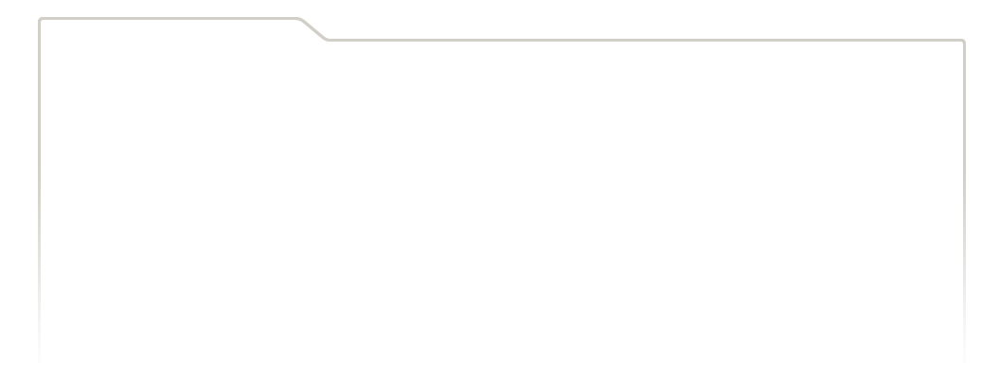
...
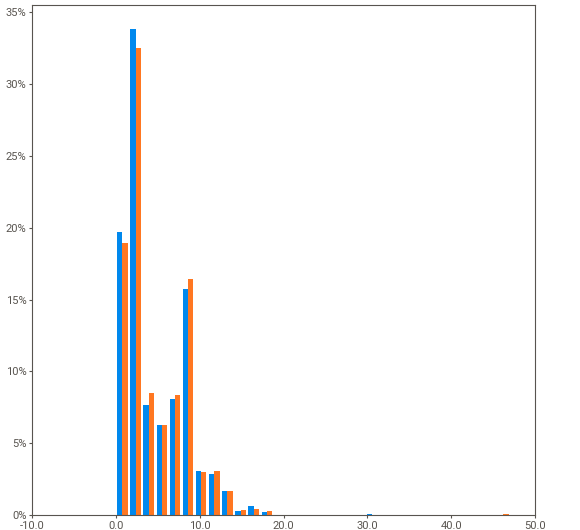
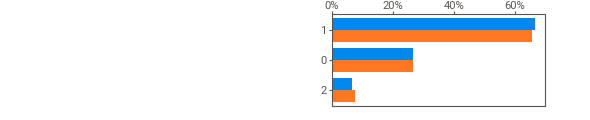
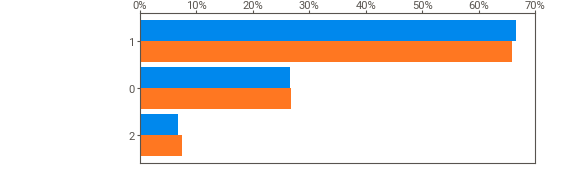
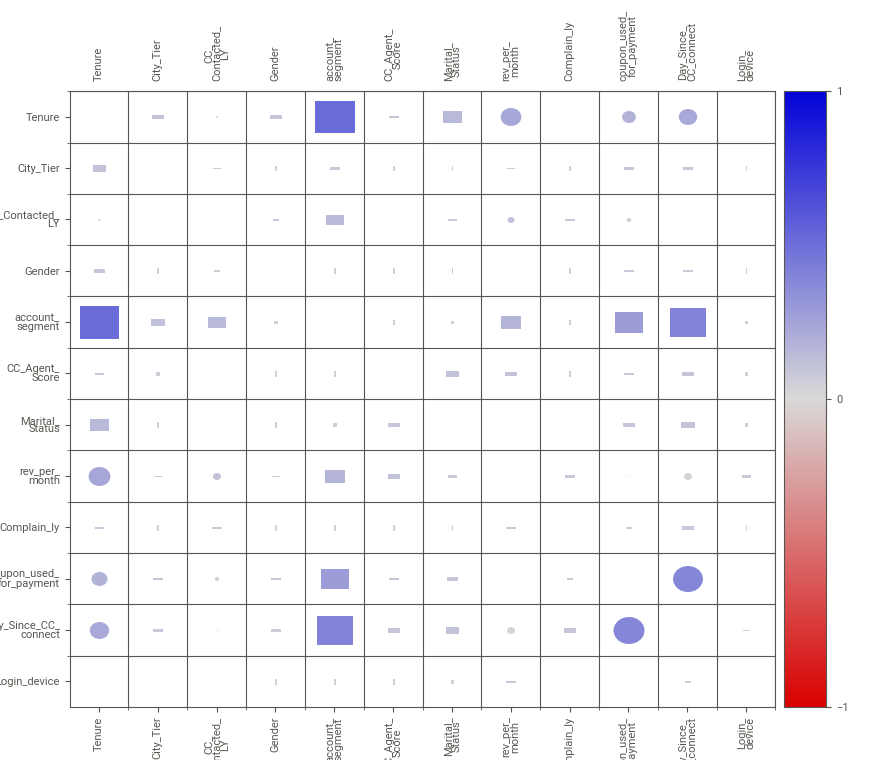
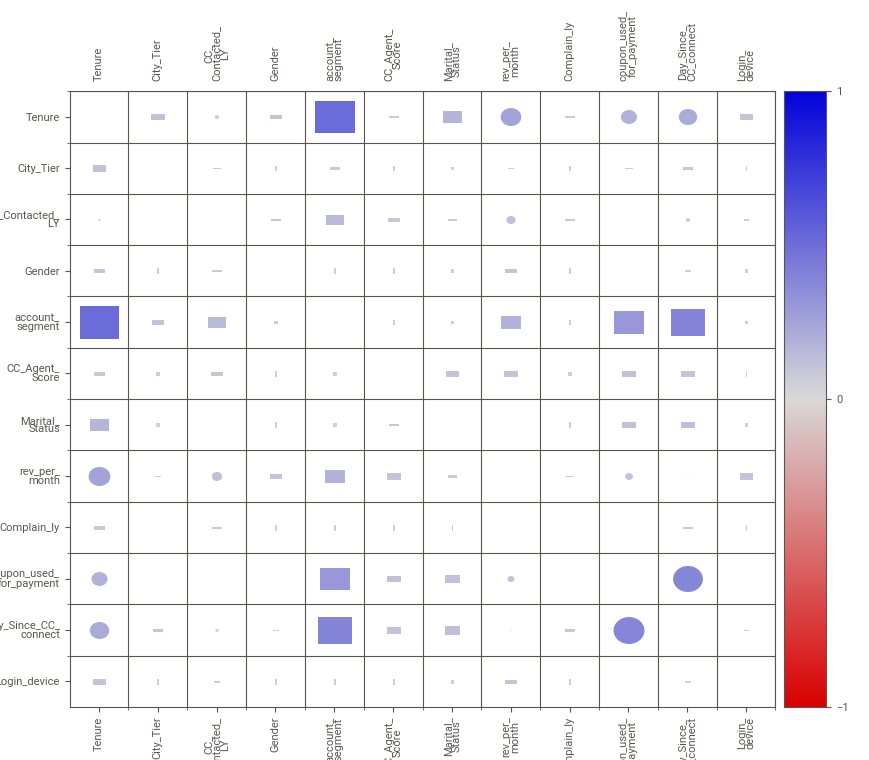

Report 'C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_Xtest.html' was saved to storage.


In [229]:
report_comp=sv.compare([X_train,'Train'],[X_test,'Test']) 
#report_comp.show_html('Compare_Results_sweetviz.html')
report_comp.show_notebook(w=None, h=None,
scale=None,
layout='vertical',
filepath='C:/Users/vino_/Desktop/Great Learning/EDA_sweetviz_Xtest.html')

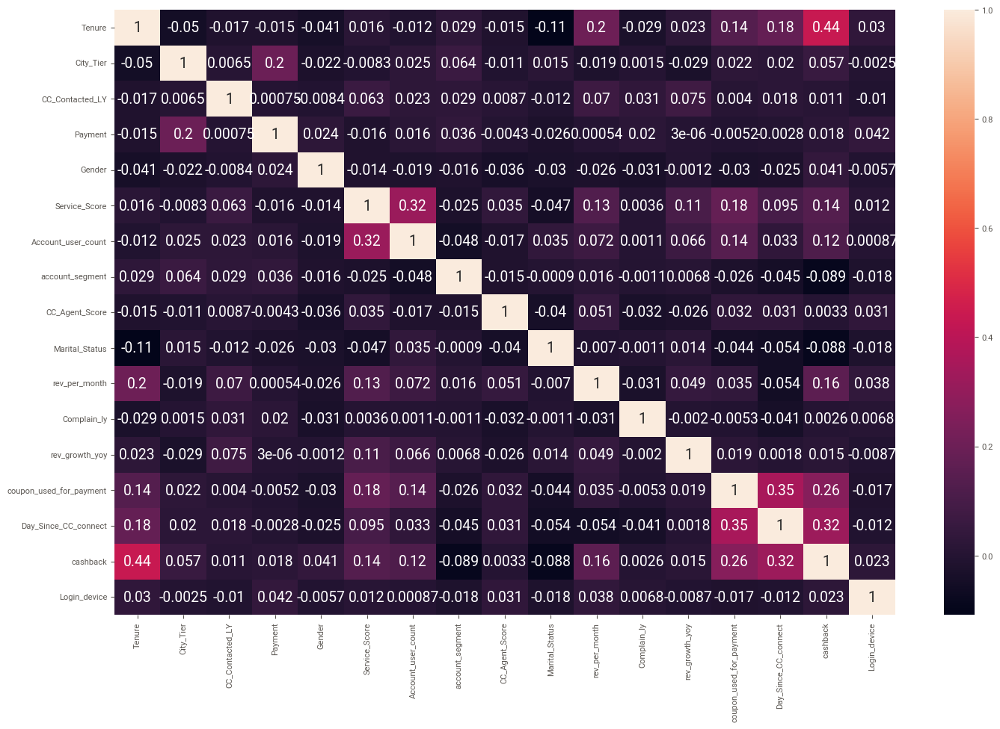

In [230]:
f, ax = plt.subplots(figsize=(15,10))
ax = sns.heatmap(df.corr(),  annot = True)

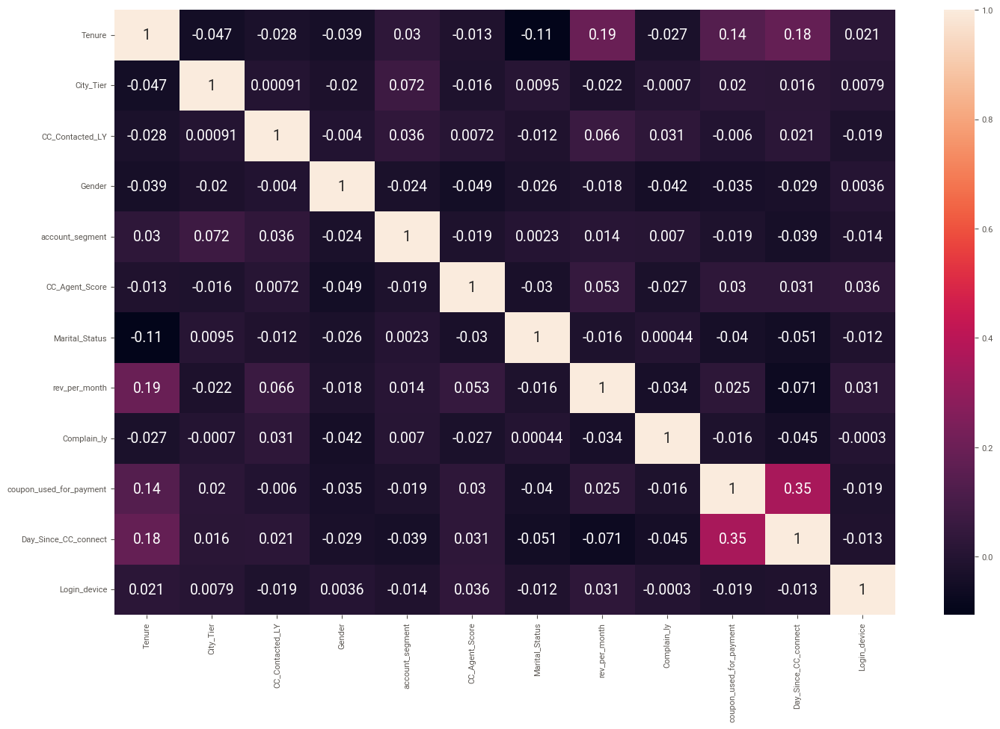

In [231]:
f, ax = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X_train.corr(), annot = True)

# Model Building 

In [232]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

# Logistic Regression

Solver Newtoncg

In [233]:
# Fit the Logistic Regression model
model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2, class_weight='balanced',tol=0.00001)
model.fit(X_train, train_labels)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   16.0s finished


LogisticRegression(class_weight='balanced', max_iter=10000, n_jobs=2,
                   penalty='none', solver='newton-cg', tol=1e-05, verbose=True)

In [234]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [235]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.998260,0.001740
1,0.119516,0.880484
2,0.498409,0.501591
3,0.980922,0.019078
4,0.463887,0.536113


Model Evaluation

In [236]:
print('model score',model.score(X_train, train_labels))
print('Model Intercept',model.intercept_)
print('Model Coeff',model.coef_)

model score 0.7744370688533125
Model Intercept [-1.48699339]
Model Coeff [[-0.15756968  0.32742005  0.01931943  0.22888986 -0.42502604  0.25599975
   0.33563512  0.12716463  1.49176679  0.1480997  -0.09827114 -0.14716081]]


Solver as lbfgs

In [237]:
model = LogisticRegression(solver='lbfgs',max_iter=10000,penalty='none',verbose=True,n_jobs=2, class_weight='balanced')
model.fit(X_train, train_labels)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   10.2s finished


LogisticRegression(class_weight='balanced', max_iter=10000, n_jobs=2,
                   penalty='none', verbose=True)

In [238]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [239]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.998259,0.001741
1,0.119540,0.880460
2,0.498406,0.501594
3,0.980912,0.019088
4,0.463872,0.536128


In [240]:
print('model score',model.score(X_train, train_labels))
print('Model Intercept',model.intercept_)
print('Model Coeff',model.coef_)

model score 0.7744370688533125
Model Intercept [-1.48781286]
Model Coeff [[-0.15756737  0.32742381  0.01932307  0.22878312 -0.42486154  0.25602069
   0.33564878  0.12717365  1.4918292   0.14807708 -0.09824456 -0.14686878]]


Solver as Sag

In [241]:
model = LogisticRegression(solver='sag',max_iter=10000,penalty='none',verbose=True,n_jobs=2, class_weight='balanced')
model.fit(X_train, train_labels)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


convergence after 76 epochs took 0 seconds


[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.2s finished


LogisticRegression(class_weight='balanced', max_iter=10000, n_jobs=2,
                   penalty='none', solver='sag', verbose=True)

In [242]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [243]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.998253,0.001747
1,0.119687,0.880313
2,0.496679,0.503321
3,0.980976,0.019024
4,0.462918,0.537082


In [244]:
print('model score',model.score(X_train, train_labels))
print('Model Intercept',model.intercept_)
print('Model Coeff',model.coef_)

model score 0.7743069113627489
Model Intercept [-1.46523389]
Model Coeff [[-0.15758441  0.32596759  0.0191544   0.22639868 -0.42614581  0.25472147
   0.33452791  0.12675046  1.48978278  0.14779813 -0.0984431  -0.14909534]]


# Solver Liblinear

In [245]:
model = LogisticRegression(solver='liblinear',max_iter=10000,verbose=True,n_jobs=2, class_weight='balanced')
model.fit(X_train, train_labels)

print('model score',model.score(X_train, train_labels))
print('Model Intercept',model.intercept_)
print('Model Coeff',model.coef_)

[LibLinear]model score 0.7744370688533125
Model Intercept [-1.44505854]
Model Coeff [[-0.15752923  0.32431466  0.01899892  0.22381574 -0.42628448  0.25339093
   0.33325113  0.1262999   1.48267717  0.14745994 -0.09851    -0.14988947]]


C:\Users\vino_\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.



In [246]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)
ytest_predict_prob=model.predict_proba(X_test)
log_liblenear_df=pd.DataFrame(ytest_predict_prob)

In [247]:
log_liblenear_df[1]

0       0.001762
1       0.879619
2       0.504151
3       0.019066
4       0.538321
          ...   
3288    0.039051
3289    0.631806
3290    0.303419
3291    0.857469
3292    0.439745
Name: 1, Length: 3293, dtype: float64

In [248]:
X_test

,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device
2398,30.0,1,7.0,1,3,3.0,1,1.0,0.0,1,8,1
6052,5.0,1,31.0,1,2,3.0,1,10.0,1.0,2,2,0
11192,5.0,1,16.0,0,2,1.0,1,4.0,1.0,1,1,1
8710,17.0,1,25.0,1,4,4.0,1,4.0,0.0,1,10,1
1094,2.0,1,15.0,0,2,3.0,1,10.0,0.0,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
942,20.0,3,20.0,0,3,3.0,0,6.0,0.0,1,2,1
1213,0.0,3,15.0,1,2,1.0,3,2.0,0.0,0,0,1
7818,0.0,1,14.0,1,2,1.0,1,6.0,0.0,1,7,1
1981,0.0,1,31.0,0,2,4.0,1,2.0,1.0,6,8,0


In [249]:
y_predict_train = model.predict(X_train)
log_train_acc = model.score(X_train, train_labels)
log_train_acc

0.7744370688533125

In [250]:
y_predict_test = model.predict(X_test)
log_test_acc = model.score(X_test, test_labels)
log_test_acc

0.7874278773155178

In [251]:
confusion_matrix(train_labels, y_predict_train)


array([[4904, 1496],
       [ 237, 1046]], dtype=int64)

In [252]:
print(classification_report(train_labels, y_predict_train))


              precision    recall  f1-score   support

           0       0.95      0.77      0.85      6400
           1       0.41      0.82      0.55      1283

    accuracy                           0.77      7683
   macro avg       0.68      0.79      0.70      7683
weighted avg       0.86      0.77      0.80      7683



In [253]:
confusion_matrix(test_labels, y_predict_test)


array([[2126,  604],
       [  96,  467]], dtype=int64)

In [254]:
print(classification_report(test_labels, y_predict_test))


              precision    recall  f1-score   support

           0       0.96      0.78      0.86      2730
           1       0.44      0.83      0.57       563

    accuracy                           0.79      3293
   macro avg       0.70      0.80      0.72      3293
weighted avg       0.87      0.79      0.81      3293



AUC: 0.865


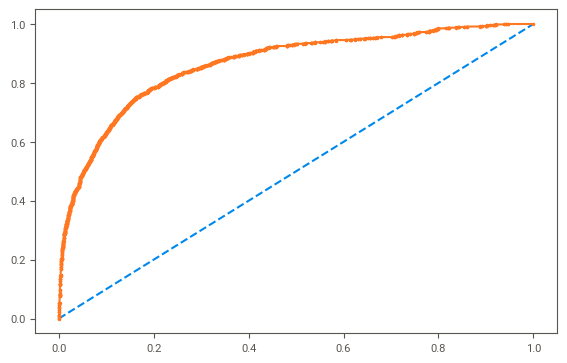

In [255]:
# predict probabilities
probs = model.predict_proba(X_train)

# keep probabilities for the positive outcome only
probs = probs[:, 1]

# calculate AUC
from sklearn.metrics import roc_auc_score
log_train_auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % log_train_auc)

# calculate roc curve
from sklearn.metrics import roc_curve
log_train_fpr, log_train_tpr, train_thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(log_train_fpr, log_train_tpr, marker='.')

# show the plot
plt.show()

AUC: 0.873


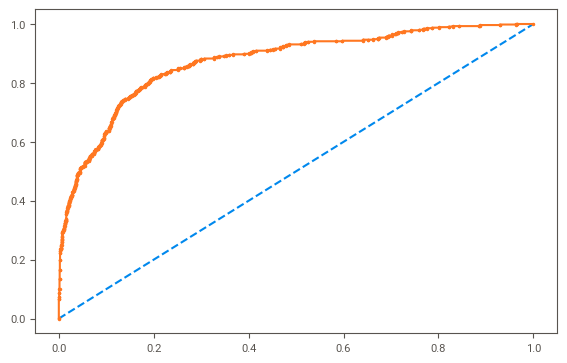

In [256]:
# AUC and ROC for the test data

# predict probabilities
probs = model.predict_proba(X_test)

# keep probabilities for the positive outcome only
probs = probs[:, 1]

# calculate AUC
from sklearn.metrics import roc_auc_score
log_test_auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % log_test_auc)

# calculate roc curve
from sklearn.metrics import roc_curve
log_test_fpr, log_test_tpr, test_thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(log_test_fpr, log_test_tpr, marker='.')

# show the plot
plt.show()

In [257]:
log_metrics=classification_report(train_labels, y_predict_train,output_dict=True)
print(log_metrics)

{'0': {'precision': 0.9539000194514686, 'recall': 0.76625, 'f1-score': 0.8498397019322416, 'support': 6400}, '1': {'precision': 0.4114870180959874, 'recall': 0.8152766952455183, 'f1-score': 0.5469281045751634, 'support': 1283}, 'accuracy': 0.7744370688533125, 'macro avg': {'precision': 0.682693518773728, 'recall': 0.7907633476227591, 'f1-score': 0.6983839032537025, 'support': 7683}, 'weighted avg': {'precision': 0.8633213547711247, 'recall': 0.7744370688533125, 'f1-score': 0.7992558701726253, 'support': 7683}}


In [258]:
model_metrics_train_df=pd.DataFrame(log_metrics).transpose()
model_metrics_train_df

,precision,recall,f1-score,support
0,0.953900,0.766250,0.849840,6400.000000
1,0.411487,0.815277,0.546928,1283.000000
accuracy,0.774437,0.774437,0.774437,0.774437
macro avg,0.682694,0.790763,0.698384,7683.000000
weighted avg,0.863321,0.774437,0.799256,7683.000000


In [259]:
log_train_precision=round(model_metrics_train_df.loc["1"][0],2)
log_train_recall=round(model_metrics_train_df.loc["1"][1],2)
log_train_f1=round(model_metrics_train_df.loc["1"][2],2)

In [260]:
print ('log_train_precision ',log_train_precision)
print ('log_train_recall ',log_train_recall)
print ('log_train_f1 ',log_train_f1)

log_train_precision  0.41
log_train_recall  0.82
log_train_f1  0.55


In [261]:
model_metrics_train_df

,precision,recall,f1-score,support
0,0.953900,0.766250,0.849840,6400.000000
1,0.411487,0.815277,0.546928,1283.000000
accuracy,0.774437,0.774437,0.774437,0.774437
macro avg,0.682694,0.790763,0.698384,7683.000000
weighted avg,0.863321,0.774437,0.799256,7683.000000


In [262]:
log_metrics=classification_report(test_labels, y_predict_test,output_dict=True)
model_metrics_test_df=pd.DataFrame(log_metrics).transpose()
log_test_precision=round(model_metrics_test_df.loc["1"][0],2)
log_test_recall=round(model_metrics_test_df.loc["1"][1],2)
log_test_f1=round(model_metrics_test_df.loc["1"][2],2)
print ('log_test_precision ',log_test_precision)
print ('log_test_recall ',log_test_recall)
print ('log_test_f1 ',log_test_f1)

log_test_precision  0.44
log_test_recall  0.83
log_test_f1  0.57


In [263]:
model_metrics_test_df

,precision,recall,f1-score,support
0,0.956796,0.778755,0.858643,2730.000000
1,0.436041,0.829485,0.571603,563.000000
accuracy,0.787428,0.787428,0.787428,0.787428
macro avg,0.696418,0.804120,0.715123,3293.000000
weighted avg,0.867763,0.787428,0.809568,3293.000000


# Linear Discrimenant Analysis

In [264]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics,model_selection

In [265]:
lda = LinearDiscriminantAnalysis()
ld_model=lda.fit(X_train,train_labels)

In [266]:
# Training Data Class Prediction with a cut-off value of 0.5
pred_class_train = ld_model.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
pred_class_test = ld_model.predict(X_test)

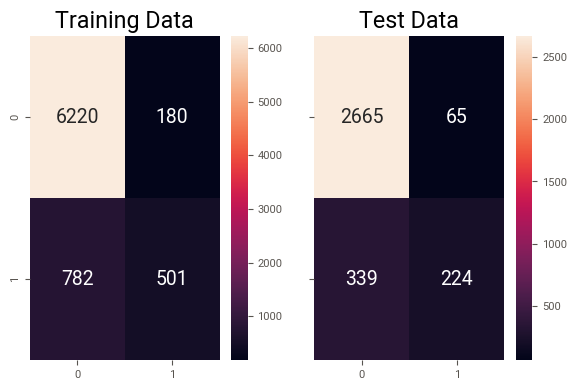

In [267]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(train_labels,pred_class_train)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(test_labels,pred_class_test)),annot=True,fmt='.5g',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [268]:
print('Classification Report of the training data:\n\n',metrics.classification_report(train_labels,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(test_labels,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.89      0.97      0.93      6400
           1       0.74      0.39      0.51      1283

    accuracy                           0.87      7683
   macro avg       0.81      0.68      0.72      7683
weighted avg       0.86      0.87      0.86      7683
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.89      0.98      0.93      2730
           1       0.78      0.40      0.53       563

    accuracy                           0.88      3293
   macro avg       0.83      0.69      0.73      3293
weighted avg       0.87      0.88      0.86      3293
 



In [269]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test)

AUC for the Training Data: 0.865
AUC for the Test Data: 0.873


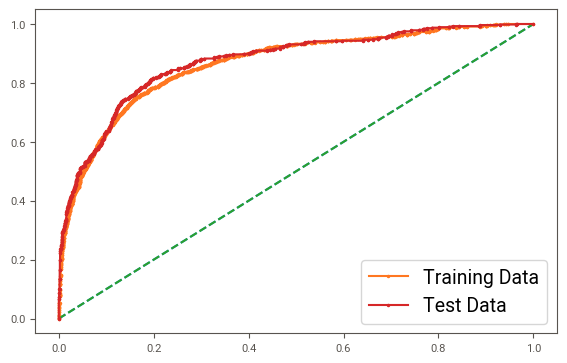

In [270]:
# AUC and ROC for the training data

# calculate AUC
lda_train_auc = metrics.roc_auc_score(train_labels,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % lda_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
lda_test_auc = metrics.roc_auc_score(test_labels,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % lda_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [271]:
lda_train_acc = model.score(X_train,train_labels)
lda_train_acc

0.7744370688533125

In [272]:
lda_test_acc = model.score(X_test,test_labels)
lda_test_acc

0.7874278773155178

In [273]:
lda_metrics=classification_report(train_labels, pred_class_train,output_dict=True)
lda_train_df=pd.DataFrame(lda_metrics).transpose()
lda_train_f1=round(lda_train_df.loc["1"][2],2)
lda_train_recall=round(lda_train_df.loc["1"][1],2)
lda_train_precision=round(lda_train_df.loc["1"][0],2)
print ('lda_train_precision ',lda_train_precision)
print ('lda_train_recall ',lda_train_recall)
print ('lda_train_f1 ',lda_train_f1)

lda_train_precision  0.74
lda_train_recall  0.39
lda_train_f1  0.51


In [274]:
lda_metrics=classification_report(test_labels, pred_class_test,output_dict=True)
lda_test_df=pd.DataFrame(lda_metrics).transpose()
lda_test_f1=round(lda_test_df.loc["0"][2],2)
lda_test_recall=round(lda_test_df.loc["0"][1],2)
lda_test_precision=round(lda_test_df.loc["0"][0],2)
print ('lda_test_precision ',lda_test_precision)
print ('lda_test_recall ',lda_test_recall)
print ('lda_test_f1 ',lda_test_f1)


lda_test_precision  0.89
lda_test_recall  0.98
lda_test_f1  0.93


# Descison Tree

In [275]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

In [276]:
param_grid = {
    'max_depth': [7,8,10,15,20,25,30,35],
    'min_samples_leaf': [5,10,20,30,40,60,80],
    'min_samples_split': [20,30,40,50,75]
}

dt_model = DecisionTreeClassifier(random_state=1)

grid_search = GridSearchCV(estimator = dt_model, param_grid = param_grid, cv = 3)

In [277]:
grid_search.fit(X_train, train_labels)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1),
             param_grid={'max_depth': [7, 8, 10, 15, 20, 25, 30, 35],
                         'min_samples_leaf': [5, 10, 20, 30, 40, 60, 80],
                         'min_samples_split': [20, 30, 40, 50, 75]})

In [278]:
grid_search.best_params_

{'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 20}

In [279]:
print(grid_search.best_params_)
best_grid = grid_search.best_estimator_
best_grid

{'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 20}


DecisionTreeClassifier(max_depth=15, min_samples_leaf=5, min_samples_split=20,
                       random_state=1)

In [280]:
grid_search.best_score_


0.8993882597943511

In [281]:
best_grid = grid_search.best_estimator_
best_grid

DecisionTreeClassifier(max_depth=15, min_samples_leaf=5, min_samples_split=20,
                       random_state=1)

In [282]:
cart_train_acc=best_grid.score(X_train,train_labels) 
cart_train_acc

0.943641806585969

In [283]:
cart_test_acc=best_grid.score(X_test,test_labels) 
cart_test_acc

0.9128454296993623

Model Performance

In [284]:
ytrain_predict = best_grid.predict(X_train)
ytest_predict = best_grid.predict(X_test)
ytrain_predict_prob=best_grid.predict_proba(X_train)
pd.DataFrame(ytrain_predict_prob).head()
ytest_predict_prob=best_grid.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,1.000000,0.000000
1,0.066667,0.933333
2,1.000000,0.000000
3,1.000000,0.000000
4,1.000000,0.000000


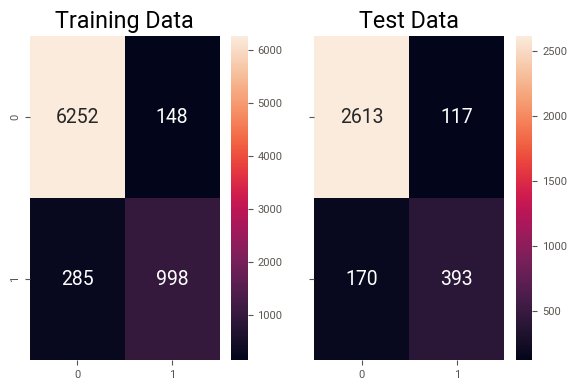

In [285]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(train_labels,ytrain_predict)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(test_labels,ytest_predict)),annot=True,fmt='.5g',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [286]:
print('Classification Report of the training data:\n\n',metrics.classification_report(train_labels,ytrain_predict),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(test_labels,ytest_predict),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.96      0.98      0.97      6400
           1       0.87      0.78      0.82      1283

    accuracy                           0.94      7683
   macro avg       0.91      0.88      0.89      7683
weighted avg       0.94      0.94      0.94      7683
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.94      0.96      0.95      2730
           1       0.77      0.70      0.73       563

    accuracy                           0.91      3293
   macro avg       0.85      0.83      0.84      3293
weighted avg       0.91      0.91      0.91      3293
 



AUC for the Training Data: 0.865
AUC for the Test Data: 0.873


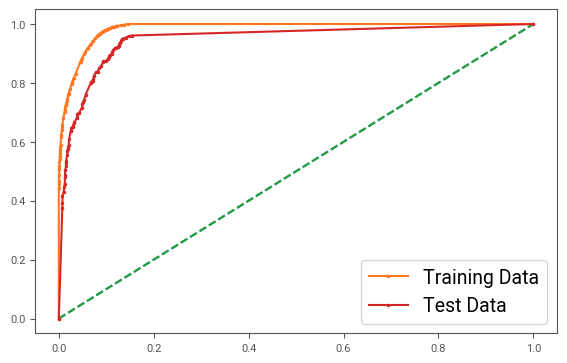

In [287]:
# AUC and ROC for the training data

# calculate AUC
cart_train_auc = metrics.roc_auc_score(train_labels,ytrain_predict_prob[:,1])
print('AUC for the Training Data: %.3f' % lda_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,ytrain_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
cart_test_auc = metrics.roc_auc_score(test_labels,ytest_predict_prob[:,1])
print('AUC for the Test Data: %.3f' % lda_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,ytest_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [288]:
cart_metrics=classification_report(train_labels, ytrain_predict,output_dict=True)
cart_train_df=pd.DataFrame(cart_metrics).transpose()
cart_train_f1=round(cart_train_df.loc["1"][2],2)
cart_train_recall=round(cart_train_df.loc["1"][1],2)
cart_train_precision=round(cart_train_df.loc["1"][0],2)
print ('cart_train_precision ',cart_train_precision)
print ('cart_train_recall ',cart_train_recall)
print ('cart_train_f1 ',cart_train_f1)

cart_train_precision  0.87
cart_train_recall  0.78
cart_train_f1  0.82


In [289]:
cart_metrics=classification_report(test_labels, ytest_predict,output_dict=True)
cart_test_df=pd.DataFrame(cart_metrics).transpose()
cart_test_precision=round(cart_test_df.loc["1"][0],2)
cart_test_recall=round(cart_test_df.loc["1"][1],2)
cart_test_f1=round(cart_test_df.loc["1"][2],2)
print ('cart_test_precision ',cart_test_precision)
print ('cart_test_recall ',cart_test_recall)
print ('cart_test_f1 ',cart_test_f1)


cart_test_precision  0.77
cart_test_recall  0.7
cart_test_f1  0.73


In [290]:
reg_dt_imp = pd.DataFrame(best_grid.feature_importances_, columns = ["Imp"], 
                          index = X_train.columns).sort_values('Imp',ascending=False)
print(reg_dt_imp)

                              Imp
Tenure                   0.386042
Day_Since_CC_connect     0.109429
CC_Agent_Score           0.082982
Complain_ly              0.076139
CC_Contacted_LY          0.067695
account_segment          0.055482
rev_per_month            0.054158
Marital_Status           0.053271
City_Tier                0.047434
Login_device             0.033491
Gender                   0.020415
coupon_used_for_payment  0.013464


# Random Forest

In [291]:
param_grid = {
    'max_depth': [5,8,10,15],
    'max_features': [3,4,5],
    'min_samples_leaf': [ 15,25,50],
    'min_samples_split': [30,45,60],
    'n_estimators': [500]
}

rfcl = RandomForestClassifier(oob_score=True)

grid_search = GridSearchCV(estimator = rfcl, param_grid = param_grid, cv = 3)

grid_search.fit(X_train, train_labels)

GridSearchCV(cv=3, estimator=RandomForestClassifier(oob_score=True),
             param_grid={'max_depth': [5, 8, 10, 15], 'max_features': [3, 4, 5],
                         'min_samples_leaf': [15, 25, 50],
                         'min_samples_split': [30, 45, 60],
                         'n_estimators': [500]})

In [292]:
best_grid = grid_search.best_estimator_

In [293]:
ytrain_predict_rand = best_grid.predict(X_train)
ytest_predict_rand = best_grid.predict(X_test)

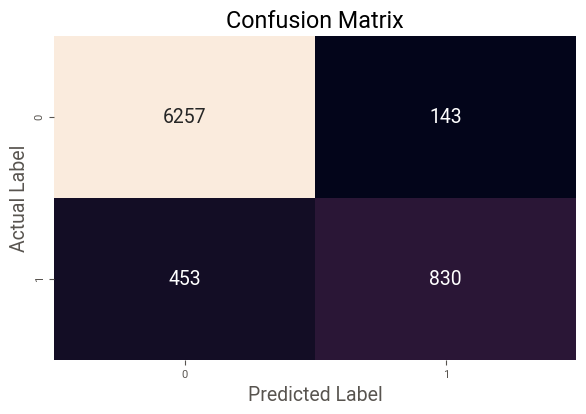

In [294]:
confusion_matrix(train_labels, ytrain_predict_rand)
sns.heatmap(confusion_matrix(train_labels,ytrain_predict_rand),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [295]:
print(classification_report(train_labels,ytrain_predict_rand))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      6400
           1       0.85      0.65      0.74      1283

    accuracy                           0.92      7683
   macro avg       0.89      0.81      0.85      7683
weighted avg       0.92      0.92      0.92      7683



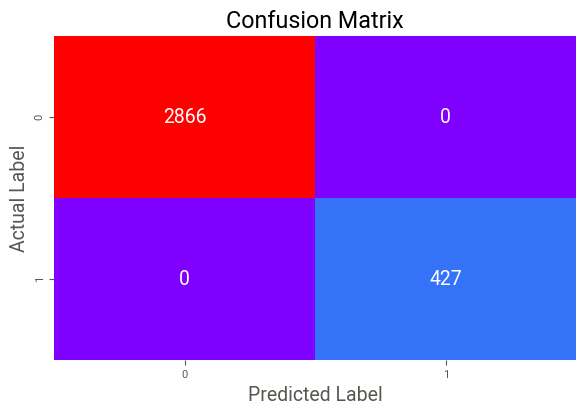

In [296]:
confusion_matrix(test_labels, ytest_predict_rand)
sns.heatmap(confusion_matrix(ytest_predict_rand,ytest_predict_rand),annot=True, fmt='d',cbar=False, cmap='rainbow')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [297]:
print(classification_report(test_labels,ytest_predict_rand))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2730
           1       0.82      0.62      0.71       563

    accuracy                           0.91      3293
   macro avg       0.87      0.80      0.83      3293
weighted avg       0.91      0.91      0.91      3293



AUC for the Test Data: 0.873


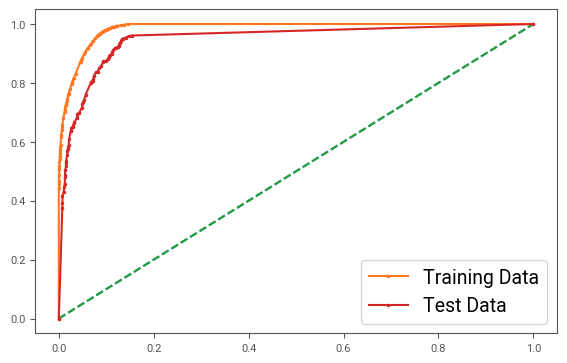

In [298]:
# AUC and ROC for the training data

# calculate AUC
rand_train_auc = metrics.roc_auc_score(train_labels,ytrain_predict_prob[:,1])

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,ytrain_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
rand_test_auc = metrics.roc_auc_score(test_labels,ytest_predict_prob[:,1])
print('AUC for the Test Data: %.3f' % lda_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,ytest_predict_prob[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [299]:
rf_train_acc=best_grid.score(X_train,train_labels) 
rf_train_acc
rf_test_acc=best_grid.score(X_test,test_labels)
rf_test_acc

0.9119344063164287

In [300]:
rf_metrics=classification_report(train_labels, ytrain_predict,output_dict=True)
rand_train_df=pd.DataFrame(rf_metrics).transpose()
rf_train_precision=round(rand_train_df.loc["1"][0],2)
rf_train_recall=round(rand_train_df.loc["1"][1],2)
rf_train_f1=round(rand_train_df.loc["1"][2],2)
print ('rf_train_precision ',rf_train_precision)
print ('rf_train_recall ',rf_train_recall)
print ('rf_train_f1 ',rf_train_f1)
rf_metrics=classification_report(test_labels, ytest_predict,output_dict=True)
rand_train_df=pd.DataFrame(rf_metrics).transpose()
rf_test_precision=round(rand_train_df.loc["1"][0],2)
rf_test_recall=round(rand_train_df.loc["1"][1],2)
rf_test_f1=round(rand_train_df.loc["1"][2],2)
print ('rf_test_precision ',rf_test_precision)
print ('rf_test_recall ',rf_test_recall)
print ('rf_test_f1 ',rf_test_f1)

rf_train_precision  0.87
rf_train_recall  0.78
rf_train_f1  0.82
rf_test_precision  0.77
rf_test_recall  0.7
rf_test_f1  0.73


# KNN

In [301]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [302]:
KNN_model=KNeighborsClassifier(n_neighbors = 15,
                              weights = 'uniform',
                              metric = 'minkowski')
KNN_model.fit(X_train,train_labels)

KNeighborsClassifier(n_neighbors=15)

In [303]:
KNN_train_predict = KNN_model.predict(X_train)
KNN_train_acc = KNN_model.score(X_train, train_labels)
KNN_train_acc

0.8914486528699727

In [304]:
KNN_test_predict = KNN_model.predict(X_test)
KNN_test_acc = KNN_model.score(X_test, test_labels)
KNN_test_acc

0.8791375645308229

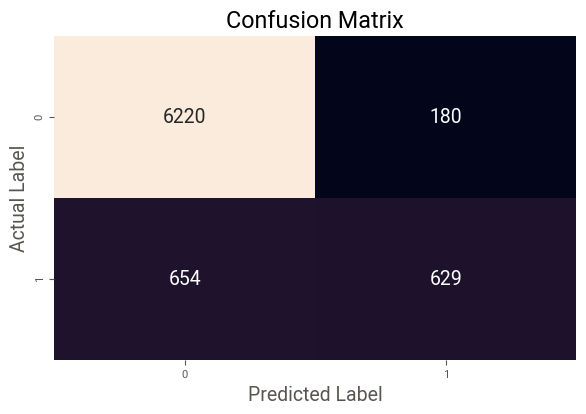

In [305]:
confusion_matrix(train_labels, KNN_train_predict)
sns.heatmap(confusion_matrix(train_labels,KNN_train_predict),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

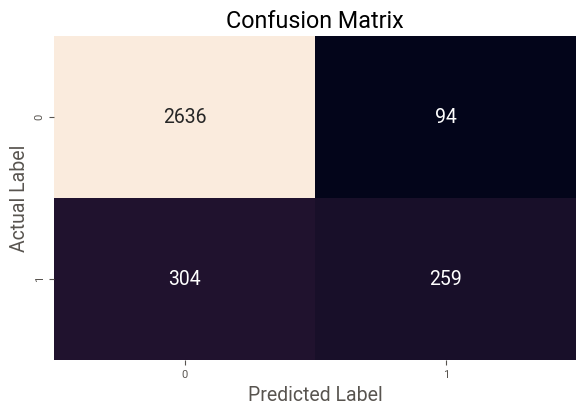

In [306]:
confusion_matrix(test_labels, KNN_test_predict)
sns.heatmap(confusion_matrix(test_labels,KNN_test_predict),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [307]:
KNN_metrics=classification_report(train_labels, KNN_train_predict,output_dict=True)
knn_train_df=pd.DataFrame(KNN_metrics).transpose()
KNN_train_f1=round(knn_train_df.loc["1"][2],2)
KNN_train_recall=round(knn_train_df.loc["1"][1],2)
KNN_train_precision=round(knn_train_df.loc["1"][0],2)
print ('KNN_train_precision ',KNN_train_precision)
print ('KNN_train_recall ',KNN_train_recall)
print ('KNN_train_f1 ',KNN_train_f1)

KNN_metrics=classification_report(test_labels, KNN_test_predict,output_dict=True)
knn_test_df=pd.DataFrame(KNN_metrics).transpose()
KNN_test_f1=round(knn_test_df.loc["1"][2],2)
KNN_test_recall=round(knn_test_df.loc["1"][1],2)
KNN_test_precision=round(knn_test_df.loc["1"][0],2)
print ('KNN_test_precision ',KNN_test_precision)
print ('KNN_test_recall ',KNN_test_recall)
print ('KNN_test_f1 ',KNN_test_f1)

KNN_train_precision  0.78
KNN_train_recall  0.49
KNN_train_f1  0.6
KNN_test_precision  0.73
KNN_test_recall  0.46
KNN_test_f1  0.57


In [308]:
accuracy_scores = []

for k in range(1,20,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, train_labels)
    scores = knn.score(X_test, test_labels)
    accuracy_scores.append(scores)

In [309]:
MCE = [1 - x for x in accuracy_scores]
MCE

[0.08472517461281504,
 0.09140601275432736,
 0.101123595505618,
 0.11084117825690865,
 0.11387792286668696,
 0.11691466747646528,
 0.11782569085939876,
 0.12086243546917708,
 0.11661099301548739,
 0.11995141208624349]

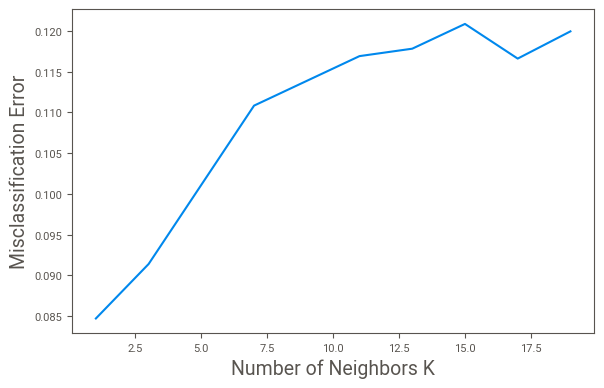

In [310]:
plt.plot(range(1,20,2), MCE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

AUC for the Training Data: 0.940
AUC for the Test Data: 0.915


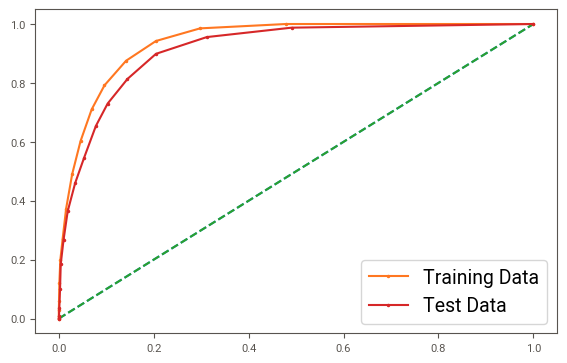

In [311]:
# AUC and ROC for the training data

# calculate AUC
probs = KNN_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
knn_train_auc = metrics.roc_auc_score(train_labels,probs)
print('AUC for the Training Data: %.3f' % knn_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
probs = KNN_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
knn_test_auc = metrics.roc_auc_score(test_labels,probs)
print('AUC for the Test Data: %.3f' % knn_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

# Gaussian Naive

In [312]:
NB_model = GaussianNB()
NB_model.fit(X_train, train_labels)

GaussianNB()

In [313]:
NB_train_predict = NB_model.predict(X_train)
NB_train_acc = NB_model.score(X_train, train_labels)   
NB_train_acc

0.869582194455291

In [314]:
NB_test_predict = NB_model.predict(X_test)
NB_test_acc = NB_model.score(X_test, test_labels)
NB_test_acc

0.8685089583965988

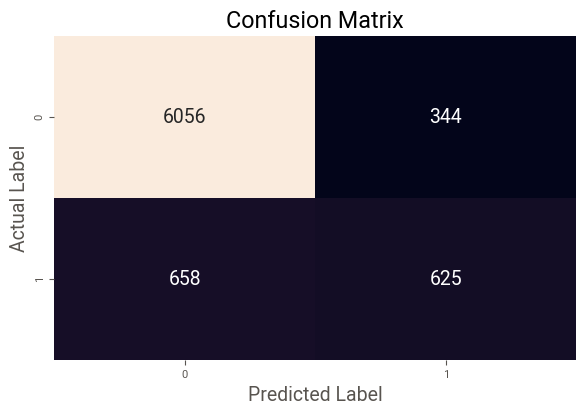

In [315]:
confusion_matrix(train_labels, NB_train_predict)
sns.heatmap(confusion_matrix(train_labels,NB_train_predict),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

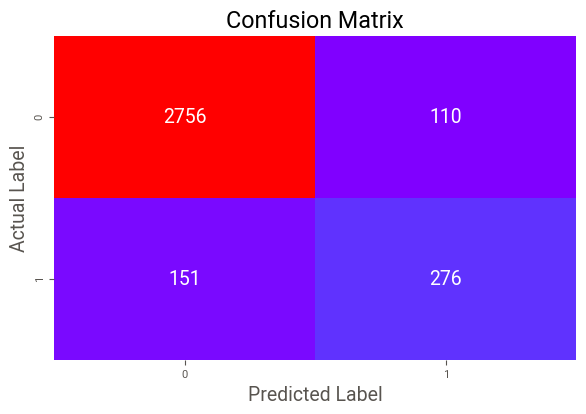

In [316]:
confusion_matrix(test_labels, NB_test_predict)
sns.heatmap(confusion_matrix(ytest_predict_rand,NB_test_predict),annot=True, fmt='d',cbar=False, cmap='rainbow')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [317]:
NB_metrics=classification_report(train_labels, NB_train_predict,output_dict=True)
NB_train_df=pd.DataFrame(NB_metrics).transpose()
NB_train_f1=round(NB_train_df.loc["1"][2],2)
NB_train_recall=round(NB_train_df.loc["1"][1],2)
NB_train_precision=round(NB_train_df.loc["1"][0],2)
print ('NB_train_precision ',NB_train_precision)
print ('NB_train_recall ',NB_train_recall)
print ('NB_train_f1 ',NB_train_f1)

NB_metrics=classification_report(test_labels, NB_test_predict,output_dict=True)
NB_test_df=pd.DataFrame(NB_metrics).transpose()
NB_test_f1=round(NB_test_df.loc["1"][2],2)
NB_test_recall=round(NB_test_df.loc["1"][1],2)
NB_test_precision=round(NB_test_df.loc["1"][0],2)
print ('NB_test_precision ',NB_test_precision)
print ('NB_test_recall ',NB_test_recall)
print ('NB_test_f1 ',NB_test_f1)

NB_train_precision  0.64
NB_train_recall  0.49
NB_train_f1  0.56
NB_test_precision  0.67
NB_test_recall  0.46
NB_test_f1  0.54


AUC for the Training Data: 0.837
AUC for the Test Data: 0.838


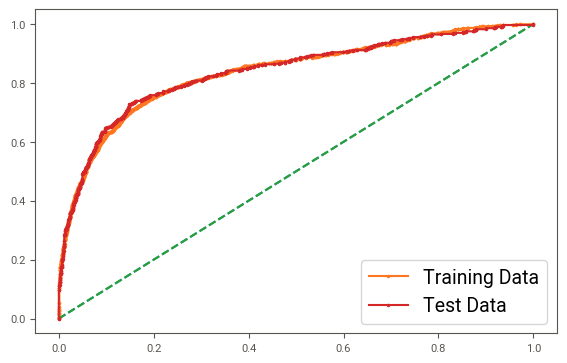

In [318]:
# AUC and ROC for the training data

# calculate AUC
probs = NB_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
nb_train_auc = metrics.roc_auc_score(train_labels,probs)
print('AUC for the Training Data: %.3f' % nb_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
probs = NB_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
nb_test_auc = metrics.roc_auc_score(test_labels,probs)
print('AUC for the Test Data: %.3f' % nb_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

# Gradient Boosting

In [319]:
from sklearn.ensemble import GradientBoostingClassifier

In [320]:
params = {'n_estimators': [100],
          'learning_rate':[0.1],
          'loss':['deviance', 'exponential'],
          'criterion':['friedman_mse', 'squared_error','mse','mae']        
         }
gbc = GradientBoostingClassifier()
grid_search = GridSearchCV(estimator = gbc, param_grid = params, cv = 3)
grid_search.fit(X_train, train_labels)
gbc_model=grid_search.best_estimator_
grid_search.best_estimator_

C:\Users\vino_\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\vino_\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\vino_\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py", line 504, in fit
    n_stages = self._fit_stages(
  File "C:\Users\vino_\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py", line 561, in _fit_stages
    raw_predictions = self._fit_stage(
  File "C:\Users\vino_\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py", line 214, in _fit_stage
    tree.fit(X, residual, sample_weight=sample_weight,
  File "C:\Users\vino_\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\vino_\anaconda3\lib\sit

C:\Users\vino_\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:1118: FutureWarning:

criterion='mae' was deprecated in version 0.24 and will be removed in version 1.1 (renaming of 0.26). Use criterion='friedman_mse' or 'mse' instead, as trees should use a least-square criterion in Gradient Boosting.

C:\Users\vino_\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning:

One or more of the test scores are non-finite: [0.90225172 0.89665495        nan        nan 0.90225172 0.89665495
 0.85422361 0.865287  ]



GradientBoostingClassifier()

In [321]:
predicted_labels = gbc_model.predict(X_test)
gbc_model.score(X_test, test_labels)

ytrain_predict = gbc_model.predict(X_train)
ytest_predict = gbc_model.predict(X_test)

AUC for the Training Data: 0.942
AUC for the Test Data: 0.936


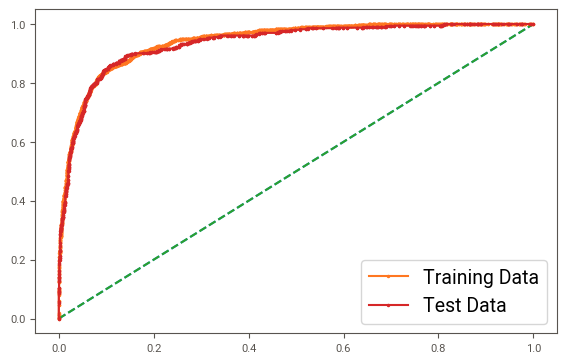

In [322]:
# calculate AUC
probs = gbc_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
gbcl_train_auc = metrics.roc_auc_score(train_labels,probs)
print('AUC for the Training Data: %.3f' % gbcl_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
probs = gbc_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
gbcl_test_auc = metrics.roc_auc_score(test_labels,probs)
print('AUC for the Test Data: %.3f' % gbcl_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

In [323]:
gbcl_metrics=classification_report(train_labels, ytrain_predict,output_dict=True)
gbc_train_df=pd.DataFrame(gbcl_metrics).transpose()
gbcl_train_f1=round(gbc_train_df.loc["1"][2],2)
gbcl_train_recall=round(gbc_train_df.loc["1"][1],2)
gbcl_train_precision=round(gbc_train_df.loc["1"][0],2)
print ('gbcl_train_precision ',gbcl_train_precision)
print ('gbcl_train_recall ',gbcl_train_recall)
print ('gbcl_train_f1 ',gbcl_train_f1)

gbcl_train_precision  0.81
gbcl_train_recall  0.61
gbcl_train_f1  0.7


In [324]:
gbcl_metrics=classification_report(test_labels, ytest_predict,output_dict=True)
gbc_test_df=pd.DataFrame(gbcl_metrics).transpose()
gbcl_test_f1=round(gbc_test_df.loc["1"][2],2)
gbcl_test_recall=round(gbc_test_df.loc["1"][1],2)
gbcl_test_precision=round(gbc_test_df.loc["1"][0],2)
print ('gbcl_test_precision ',gbcl_test_precision)
print ('gbcl_test_recall ',gbcl_test_recall)
print ('gbcl_test_f1 ',gbcl_test_f1)

gbcl_test_precision  0.79
gbcl_test_recall  0.62
gbcl_test_f1  0.7


In [325]:
gbcl_train_predict = gbc_model.predict(X_train)
gbcl_test_predict = gbc_model.predict(X_test)

In [326]:
gbcl_train_acc = gbc_model.score(X_train,train_labels)
gbcl_train_acc

0.9108421189639464

In [327]:
gbcl_test_acc = gbc_model.score(X_test,test_labels)
gbcl_test_acc

0.9073792894017613

# Xtreme Gradient Boosting

In [385]:
from xgboost import XGBClassifier

In [329]:
xgb_model = XGBClassifier(max_depth=5, learning_rate=0.08, objective= 'binary:logistic',n_jobs=-1).fit(X_train, train_labels)

In [330]:
print('Accuracy of XGB classifier on training set: {:.2f}'
       .format(xgb_model.score(X_train, train_labels)))
print('Accuracy of XGB classifier on test set: {:.2f}'
       .format(xgb_model.score(X_test[X_train.columns], test_labels)))

Accuracy of XGB classifier on training set: 0.94
Accuracy of XGB classifier on test set: 0.92


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

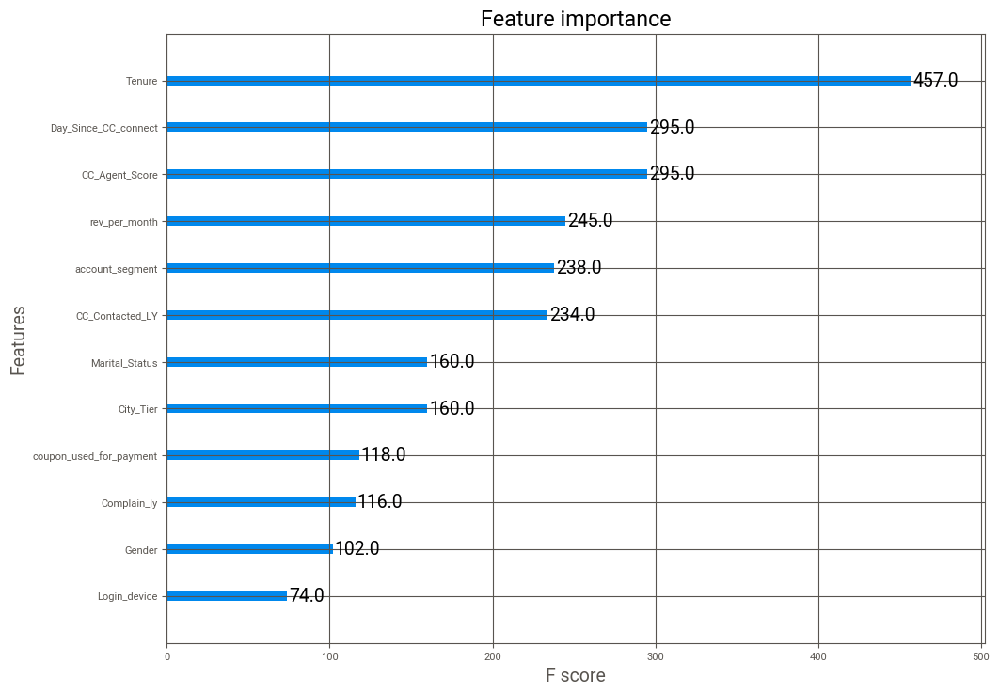

In [331]:
from xgboost import plot_importance
fig, ax = plt.subplots(figsize=(10,8))
plot_importance(xgb_model, ax=ax)

In [332]:
xgb_train_predict = xgb_model.predict(X_train)
xgb_test_predict = xgb_model.predict(X_test)

In [333]:

ytest_predict_prob=xgb_model.predict_proba(X_test)
Xtrmeboost_test_df=pd.DataFrame(ytest_predict_prob)

In [334]:
xgb_train_acc = xgb_model.score(X_train,train_labels)
xgb_train_acc

0.9370037745672264

In [335]:
xgb_test_acc = xgb_model.score(X_test,test_labels)
xgb_test_acc

0.9243850592165199

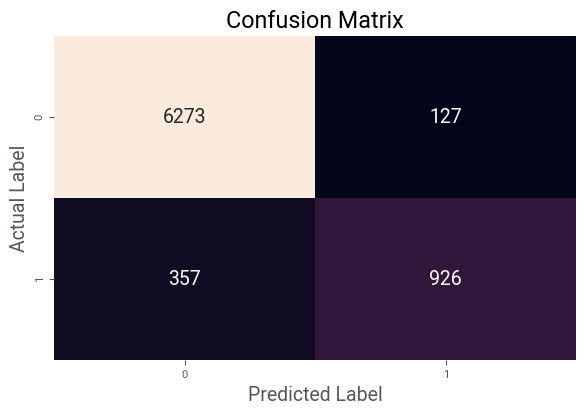

In [336]:
confusion_matrix(train_labels, xgb_train_predict)
sns.heatmap(confusion_matrix(train_labels,xgb_train_predict),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

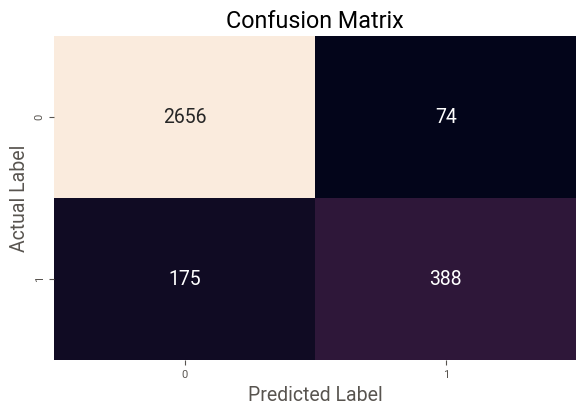

In [337]:
confusion_matrix(test_labels, xgb_test_predict)
sns.heatmap(confusion_matrix(test_labels,xgb_test_predict),annot=True, fmt='d',cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix')
plt.show()

In [338]:
xgb_metrics=classification_report(train_labels, xgb_train_predict,output_dict=True)
xgb_train_df=pd.DataFrame(xgb_metrics).transpose()
xgb_train_f1=round(xgb_train_df.loc["1"][2],2)
xgb_train_recall=round(xgb_train_df.loc["1"][1],2)
xgb_train_precision=round(xgb_train_df.loc["1"][0],2)
print ('gbcl_train_precision ',xgb_train_precision)
print ('gbcl_train_recall ',xgb_train_recall)
print ('gbcl_train_f1 ',xgb_train_f1)

gbcl_train_precision  0.88
gbcl_train_recall  0.72
gbcl_train_f1  0.79


In [339]:
xgb_metrics=classification_report(test_labels, xgb_test_predict,output_dict=True)
xgb_test_df=pd.DataFrame(xgb_metrics).transpose()
xgb_test_f1=round(xgb_test_df.loc["1"][2],2)
xgb_test_recall=round(xgb_test_df.loc["1"][1],2)
xgb_test_precision=round(xgb_test_df.loc["1"][0],2)
print ('gbcl_test_precision ',xgb_test_precision)
print ('gbcl_test_recall ',xgb_test_recall)
print ('gbcl_test_f1 ',xgb_test_f1)

gbcl_test_precision  0.84
gbcl_test_recall  0.69
gbcl_test_f1  0.76


AUC for the Training Data: 0.942
AUC for the Test Data: 0.936


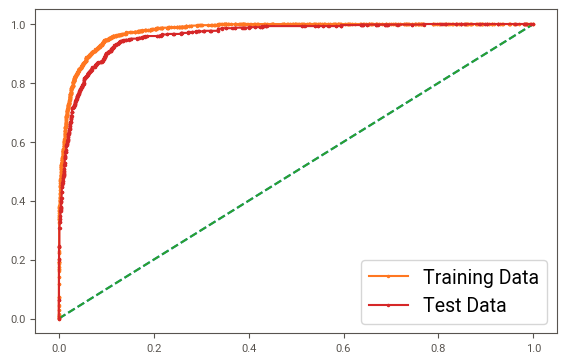

In [340]:
# calculate AUC
probs = xgb_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
xgb_train_auc = metrics.roc_auc_score(train_labels,probs)
print('AUC for the Training Data: %.3f' % gbcl_train_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(train_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
probs = xgb_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
xgb_test_auc = metrics.roc_auc_score(test_labels,probs)
print('AUC for the Test Data: %.3f' % gbcl_test_auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(test_labels,probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

# Model Performance

Train

In [341]:
index=['Accuracy', 'AUC', 'Recall','Precision','F1 Score']
train_metric = pd.DataFrame({
       'CART Train':[cart_train_acc,cart_train_auc,cart_train_recall,cart_train_precision,cart_train_f1],
       'RF Train':[rf_train_acc,rand_train_auc,rf_train_recall,rf_train_precision,rf_train_f1],
       'Log Train':[log_train_acc,log_train_auc,log_train_recall,log_train_precision,log_train_f1],          
       'LDA Train':[lda_train_acc,lda_train_auc,lda_train_recall,lda_train_precision,lda_train_f1],
       'KNN Train':[KNN_train_acc,knn_train_auc,KNN_train_recall,KNN_train_precision,KNN_train_f1],
       'NB Train':[NB_train_acc,nb_train_auc,NB_train_recall,NB_train_precision,NB_train_f1],
       'Gradient Boost Train':[gbcl_train_acc,gbcl_train_auc,gbcl_train_recall,gbcl_train_precision,gbcl_train_f1], 
    'XG Boost Train':[xgb_train_acc,xgb_train_auc,xgb_train_recall,xgb_train_precision,xgb_train_f1]
       },index=index)
train_metric=round(train_metric,2)
train_metric

,CART Train,RF Train,Log Train,LDA Train,KNN Train,NB Train,Gradient Boost Train,XG Boost Train
Accuracy,0.94,0.92,0.77,0.77,0.89,0.87,0.91,0.94
AUC,0.99,0.99,0.86,0.86,0.94,0.84,0.94,0.98
Recall,0.78,0.78,0.82,0.39,0.49,0.49,0.61,0.72
Precision,0.87,0.87,0.41,0.74,0.78,0.64,0.81,0.88
F1 Score,0.82,0.82,0.55,0.51,0.60,0.56,0.70,0.79


     Test

In [342]:
index=['Accuracy', 'AUC', 'Recall','Precision','F1 Score']
test_metric = pd.DataFrame({
        'CART Test':[cart_test_acc,cart_test_auc,cart_test_recall,cart_test_precision,cart_test_f1],
        'RF Test':[rf_test_acc,rand_train_auc,rf_test_recall,rf_test_precision,rf_test_f1],
        'Log Test':[log_test_acc,log_test_auc,log_test_recall,log_test_precision,log_test_f1],           
        'LDA Test':[lda_test_acc,lda_test_auc,lda_test_recall,lda_test_precision,lda_test_f1],
        'KNN Test':[KNN_test_acc,knn_test_auc,KNN_test_recall,KNN_test_precision,KNN_test_f1],  
        'NB Test':[NB_test_acc,nb_test_auc,NB_test_recall,NB_test_precision,NB_test_f1],
        'Gradient Boost Test':[gbcl_test_acc,gbcl_test_auc,gbcl_test_recall,gbcl_test_precision,gbcl_test_f1],  
        'XG Boost Test':[xgb_test_acc,xgb_test_auc,xgb_test_recall,xgb_test_precision,xgb_test_f1]
},index=index)
round(test_metric,2)

,CART Test,RF Test,Log Test,LDA Test,KNN Test,NB Test,Gradient Boost Test,XG Boost Test
Accuracy,0.91,0.91,0.79,0.79,0.88,0.87,0.91,0.92
AUC,0.95,0.99,0.87,0.87,0.92,0.84,0.94,0.96
Recall,0.70,0.70,0.83,0.98,0.46,0.46,0.62,0.69
Precision,0.77,0.77,0.44,0.89,0.73,0.67,0.79,0.84
F1 Score,0.73,0.73,0.57,0.93,0.57,0.54,0.70,0.76


In [343]:
train_metric=round(train_metric,2)
train_metric

,CART Train,RF Train,Log Train,LDA Train,KNN Train,NB Train,Gradient Boost Train,XG Boost Train
Accuracy,0.94,0.92,0.77,0.77,0.89,0.87,0.91,0.94
AUC,0.99,0.99,0.86,0.86,0.94,0.84,0.94,0.98
Recall,0.78,0.78,0.82,0.39,0.49,0.49,0.61,0.72
Precision,0.87,0.87,0.41,0.74,0.78,0.64,0.81,0.88
F1 Score,0.82,0.82,0.55,0.51,0.60,0.56,0.70,0.79


In [344]:
df

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,4.0,3,6.0,2,0,3.0,3,3,2.0,3,9.0,1.0,11.0,1,5,159.93000,1
1,0.0,1,8.0,5,1,3.0,4,2,3.0,3,7.0,1.0,15.0,0,0,120.90000,1
2,0.0,1,30.0,2,1,2.0,4,2,3.0,3,6.0,1.0,14.0,0,3,196.23637,1
3,0.0,3,15.0,2,1,2.0,4,3,5.0,3,8.0,0.0,23.0,0,3,134.07000,1
4,0.0,1,12.0,1,1,2.0,3,2,5.0,3,3.0,0.0,11.0,1,3,129.60000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,10.0,1,34.0,1,1,3.0,2,3,1.0,1,9.0,0.0,19.0,1,4,153.71000,0
11256,13.0,1,19.0,1,1,3.0,5,0,5.0,1,7.0,0.0,16.0,1,8,226.91000,1
11257,1.0,1,14.0,2,1,3.0,2,3,4.0,1,7.0,1.0,22.0,1,4,191.42000,1
11258,23.0,3,11.0,1,1,4.0,5,3,4.0,1,7.0,0.0,16.0,2,9,179.90000,0


In [345]:
predicted_df=df

In [346]:
predicted_df

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,4.0,3,6.0,2,0,3.0,3,3,2.0,3,9.0,1.0,11.0,1,5,159.93000,1
1,0.0,1,8.0,5,1,3.0,4,2,3.0,3,7.0,1.0,15.0,0,0,120.90000,1
2,0.0,1,30.0,2,1,2.0,4,2,3.0,3,6.0,1.0,14.0,0,3,196.23637,1
3,0.0,3,15.0,2,1,2.0,4,3,5.0,3,8.0,0.0,23.0,0,3,134.07000,1
4,0.0,1,12.0,1,1,2.0,3,2,5.0,3,3.0,0.0,11.0,1,3,129.60000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11255,10.0,1,34.0,1,1,3.0,2,3,1.0,1,9.0,0.0,19.0,1,4,153.71000,0
11256,13.0,1,19.0,1,1,3.0,5,0,5.0,1,7.0,0.0,16.0,1,8,226.91000,1
11257,1.0,1,14.0,2,1,3.0,2,3,4.0,1,7.0,1.0,22.0,1,4,191.42000,1
11258,23.0,3,11.0,1,1,4.0,5,3,4.0,1,7.0,0.0,16.0,2,9,179.90000,0


In [347]:
log_liblenear_df[1]

0       0.001762
1       0.879619
2       0.504151
3       0.019066
4       0.538321
          ...   
3288    0.039051
3289    0.631806
3290    0.303419
3291    0.857469
3292    0.439745
Name: 1, Length: 3293, dtype: float64

In [348]:
test_df=X_test

In [349]:
test_df=test_df.reset_index()

In [350]:
predicted_df= pd.merge(test_df, log_liblenear_df[1], left_index=True ,right_index=True)
predicted_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,1
0,2398,30.0,1,7.0,1,3,3.0,1,1.0,0.0,1,8,1,0.001762
1,6052,5.0,1,31.0,1,2,3.0,1,10.0,1.0,2,2,0,0.879619
2,11192,5.0,1,16.0,0,2,1.0,1,4.0,1.0,1,1,1,0.504151
3,8710,17.0,1,25.0,1,4,4.0,1,4.0,0.0,1,10,1,0.019066
4,1094,2.0,1,15.0,0,2,3.0,1,10.0,0.0,1,2,1,0.538321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,0,3,3.0,0,6.0,0.0,1,2,1,0.039051
3289,1213,0.0,3,15.0,1,2,1.0,3,2.0,0.0,0,0,1,0.631806
3290,7818,0.0,1,14.0,1,2,1.0,1,6.0,0.0,1,7,1,0.303419
3291,1981,0.0,1,31.0,0,2,4.0,1,2.0,1.0,6,8,0,0.857469


In [351]:
predicted_df['Churn_prob']=predicted_df[1]

In [352]:
predicted_df.drop(1,axis=1,inplace=True)

In [353]:
predicted_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3293 entries, 0 to 3292
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   index                    3293 non-null   int64  
 1   Tenure                   3293 non-null   float64
 2   City_Tier                3293 non-null   int64  
 3   CC_Contacted_LY          3293 non-null   float64
 4   Gender                   3293 non-null   int8   
 5   account_segment          3293 non-null   int8   
 6   CC_Agent_Score           3293 non-null   float64
 7   Marital_Status           3293 non-null   int8   
 8   rev_per_month            3293 non-null   float64
 9   Complain_ly              3293 non-null   float64
 10  coupon_used_for_payment  3293 non-null   int64  
 11  Day_Since_CC_connect     3293 non-null   int32  
 12  Login_device             3293 non-null   int8   
 13  Churn_prob               3293 non-null   float64
dtypes: float64(6), int32(1),

In [354]:
predicted_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,Churn_prob
0,2398,30.0,1,7.0,1,3,3.0,1,1.0,0.0,1,8,1,0.001762
1,6052,5.0,1,31.0,1,2,3.0,1,10.0,1.0,2,2,0,0.879619
2,11192,5.0,1,16.0,0,2,1.0,1,4.0,1.0,1,1,1,0.504151
3,8710,17.0,1,25.0,1,4,4.0,1,4.0,0.0,1,10,1,0.019066
4,1094,2.0,1,15.0,0,2,3.0,1,10.0,0.0,1,2,1,0.538321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,0,3,3.0,0,6.0,0.0,1,2,1,0.039051
3289,1213,0.0,3,15.0,1,2,1.0,3,2.0,0.0,0,0,1,0.631806
3290,7818,0.0,1,14.0,1,2,1.0,1,6.0,0.0,1,7,1,0.303419
3291,1981,0.0,1,31.0,0,2,4.0,1,2.0,1.0,6,8,0,0.857469


In [355]:
def assign_flag(row):
    if row >= 0.5:
        result = 1
    else:
        result = 0
    return result

In [356]:
predicted_df['Churn_predicted']=predicted_df['Churn_prob'].apply(assign_flag)
predicted_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,Churn_prob,Churn_predicted
0,2398,30.0,1,7.0,1,3,3.0,1,1.0,0.0,1,8,1,0.001762,0
1,6052,5.0,1,31.0,1,2,3.0,1,10.0,1.0,2,2,0,0.879619,1
2,11192,5.0,1,16.0,0,2,1.0,1,4.0,1.0,1,1,1,0.504151,1
3,8710,17.0,1,25.0,1,4,4.0,1,4.0,0.0,1,10,1,0.019066,0
4,1094,2.0,1,15.0,0,2,3.0,1,10.0,0.0,1,2,1,0.538321,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,0,3,3.0,0,6.0,0.0,1,2,1,0.039051,0
3289,1213,0.0,3,15.0,1,2,1.0,3,2.0,0.0,0,0,1,0.631806,1
3290,7818,0.0,1,14.0,1,2,1.0,1,6.0,0.0,1,7,1,0.303419,0
3291,1981,0.0,1,31.0,0,2,4.0,1,2.0,1.0,6,8,0,0.857469,1


In [357]:
predicted_df_bkp=predicted_df

In [358]:
predicted_df['Gender']=predicted_df['Gender'].replace({0:'F',1:'M',2:'No Data'})
predicted_df['account_segment']=predicted_df['account_segment'].replace({3:'HNI',2:'Regular',1:'Regular Plus',0:'Super',4:'Super Plus'})
predicted_df['Marital_Status']=predicted_df['Marital_Status'].replace({3:'Divorced',0:'Married',1:'No Data',2:'Single'})
predicted_df['Login_device']=predicted_df['Login_device'].replace({1:'Computer',0:'Mobile',2:'Others'})

In [359]:
predicted_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,Churn_prob,Churn_predicted
0,2398,30.0,1,7.0,M,HNI,3.0,No Data,1.0,0.0,1,8,Computer,0.001762,0
1,6052,5.0,1,31.0,M,Regular,3.0,No Data,10.0,1.0,2,2,Mobile,0.879619,1
2,11192,5.0,1,16.0,F,Regular,1.0,No Data,4.0,1.0,1,1,Computer,0.504151,1
3,8710,17.0,1,25.0,M,Super Plus,4.0,No Data,4.0,0.0,1,10,Computer,0.019066,0
4,1094,2.0,1,15.0,F,Regular,3.0,No Data,10.0,0.0,1,2,Computer,0.538321,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,F,HNI,3.0,Married,6.0,0.0,1,2,Computer,0.039051,0
3289,1213,0.0,3,15.0,M,Regular,1.0,Divorced,2.0,0.0,0,0,Computer,0.631806,1
3290,7818,0.0,1,14.0,M,Regular,1.0,No Data,6.0,0.0,1,7,Computer,0.303419,0
3291,1981,0.0,1,31.0,F,Regular,4.0,No Data,2.0,1.0,6,8,Mobile,0.857469,1


In [360]:
predicted_df.to_csv('Logistic_reg_liblinear_prediction.csv')

In [361]:
Xtrmeboost_test_df[1]

0       0.001680
1       0.522174
2       0.179069
3       0.011449
4       0.029661
          ...   
3288    0.011496
3289    0.676629
3290    0.147331
3291    0.631585
3292    0.026917
Name: 1, Length: 3293, dtype: float32

In [362]:
predicted_xtreme_df= pd.merge(test_df, Xtrmeboost_test_df[1], left_index=True ,right_index=True)
predicted_xtreme_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,1
0,2398,30.0,1,7.0,1,3,3.0,1,1.0,0.0,1,8,1,0.001680
1,6052,5.0,1,31.0,1,2,3.0,1,10.0,1.0,2,2,0,0.522174
2,11192,5.0,1,16.0,0,2,1.0,1,4.0,1.0,1,1,1,0.179069
3,8710,17.0,1,25.0,1,4,4.0,1,4.0,0.0,1,10,1,0.011449
4,1094,2.0,1,15.0,0,2,3.0,1,10.0,0.0,1,2,1,0.029661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,0,3,3.0,0,6.0,0.0,1,2,1,0.011496
3289,1213,0.0,3,15.0,1,2,1.0,3,2.0,0.0,0,0,1,0.676629
3290,7818,0.0,1,14.0,1,2,1.0,1,6.0,0.0,1,7,1,0.147331
3291,1981,0.0,1,31.0,0,2,4.0,1,2.0,1.0,6,8,0,0.631585


In [363]:
predicted_xtreme_df['Gender']=predicted_xtreme_df['Gender'].replace({0:'F',1:'M',2:'No Data'})
predicted_xtreme_df['account_segment']=predicted_xtreme_df['account_segment'].replace({3:'HNI',2:'Regular',1:'Regular Plus',0:'Super',4:'Super Plus'})
predicted_xtreme_df['Marital_Status']=predicted_xtreme_df['Marital_Status'].replace({3:'Divorced',0:'Married',1:'No Data',2:'Single'})
predicted_xtreme_df['Login_device']=predicted_xtreme_df['Login_device'].replace({1:'Computer',0:'Mobile',2:'Others'})

In [364]:
predicted_xtreme_df['Churn_prob']=predicted_xtreme_df[1]

In [365]:
predicted_xtreme_df['Churn_predicted']=predicted_xtreme_df['Churn_prob'].apply(assign_flag)
predicted_xtreme_df

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,1,Churn_prob,Churn_predicted
0,2398,30.0,1,7.0,M,HNI,3.0,No Data,1.0,0.0,1,8,Computer,0.001680,0.001680,0
1,6052,5.0,1,31.0,M,Regular,3.0,No Data,10.0,1.0,2,2,Mobile,0.522174,0.522174,1
2,11192,5.0,1,16.0,F,Regular,1.0,No Data,4.0,1.0,1,1,Computer,0.179069,0.179069,0
3,8710,17.0,1,25.0,M,Super Plus,4.0,No Data,4.0,0.0,1,10,Computer,0.011449,0.011449,0
4,1094,2.0,1,15.0,F,Regular,3.0,No Data,10.0,0.0,1,2,Computer,0.029661,0.029661,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288,942,20.0,3,20.0,F,HNI,3.0,Married,6.0,0.0,1,2,Computer,0.011496,0.011496,0
3289,1213,0.0,3,15.0,M,Regular,1.0,Divorced,2.0,0.0,0,0,Computer,0.676629,0.676629,1
3290,7818,0.0,1,14.0,M,Regular,1.0,No Data,6.0,0.0,1,7,Computer,0.147331,0.147331,0
3291,1981,0.0,1,31.0,F,Regular,4.0,No Data,2.0,1.0,6,8,Mobile,0.631585,0.631585,1


In [366]:
predicted_xtreme_df.to_csv('Xtreme_Predicted.csv')

In [367]:
predicted_xtreme_df.head()

,index,Tenure,City_Tier,CC_Contacted_LY,Gender,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,coupon_used_for_payment,Day_Since_CC_connect,Login_device,1,Churn_prob,Churn_predicted
0,2398,30.0,1,7.0,M,HNI,3.0,No Data,1.0,0.0,1,8,Computer,0.001680,0.001680,0
1,6052,5.0,1,31.0,M,Regular,3.0,No Data,10.0,1.0,2,2,Mobile,0.522174,0.522174,1
2,11192,5.0,1,16.0,F,Regular,1.0,No Data,4.0,1.0,1,1,Computer,0.179069,0.179069,0
3,8710,17.0,1,25.0,M,Super Plus,4.0,No Data,4.0,0.0,1,10,Computer,0.011449,0.011449,0
4,1094,2.0,1,15.0,F,Regular,3.0,No Data,10.0,0.0,1,2,Computer,0.029661,0.029661,0


In [368]:
df_plot = predicted_xtreme_df.groupby('Tenure').Churn_predicted.mean().reset_index()
plot_data = [
    go.Scatter(
        x=df_plot['Tenure'],
        y=df_plot['Churn_predicted'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "Tenure"},
        title='Tenure based Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [374]:
df_plot = predicted_xtreme_df.groupby('Day_Since_CC_connect').Churn_predicted.mean().reset_index()
plot_data = [
    go.Scatter(
        x=df_plot['Day_Since_CC_connect'],
        y=df_plot['Churn_predicted'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "Day_Since_CC_connect"},
        title='Day_Since_CC_connect based Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [384]:
df_plot = predicted_xtreme_df.groupby('CC_Agent_Score').Churn_predicted.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['CC_Agent_Score'],
        y=df_plot['Churn_predicted'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='CC_Agent_Score'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [383]:
df_plot = predicted_xtreme_df.groupby('rev_per_month').Churn_predicted.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['rev_per_month'],
        y=df_plot['Churn_predicted'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='rev_per_month'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [377]:
df_plot = predicted_xtreme_df.groupby('account_segment').Churn_predicted.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['account_segment'],
        y=df_plot['Churn_predicted'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='account_segment'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [382]:
df_plot = predicted_xtreme_df.groupby('CC_Contacted_LY').Churn_predicted.mean().reset_index()
plot_data = [
    go.Bar(
        x=df_plot['CC_Contacted_LY'],
        y=df_plot['Churn_predicted'],
        width = [0.5, 0.5]
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='CC_Contacted_LY'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)